### Package imports

In [2]:
# Initializations
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

import tensorflow as tf
from keras import metrics
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input, Dense, Concatenate, Lambda, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split, KFold
tf.get_logger().setLevel('ERROR')

%config InlineBackend.figure_formats = ['svg']
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams.update({'mathtext.fontset':'cm'})
mpl.rcParams.update({'font.family':'serif'})
mpl.rcParams.update({'font.serif':'STIXGeneral'})
mpl.rcParams.update({'axes.titlesize':18})
mpl.rcParams.update({'axes.labelsize': 20})
mpl.rcParams.update({'axes.labelpad':12})
mpl.rcParams.update({'axes.linewidth': 0.5})
mpl.rcParams.update({'xtick.labelsize': 12})
mpl.rcParams.update({'ytick.labelsize': 12})

## PINN Drag without velocity

In [26]:
%reset -f array
%matplotlib inline

# free up memory from previous plots_________________
plt.close('all')
plt.clf()

# load dataset _______________________________________
Re = 1
n_closest = 50
N_1 = 192
if N_1 == 192: 
    N_2 = 768
    N_set = 20
else:
    N_2 = 1536
    N_set = 10

num_p_incl = 25
N_neurons = 15
epochs = 200
lr = 1.2e-2
verbose = 0
batch_size = 128

# coord, title = 'F_x', r'$ Re = ' + f'{Re},' + r' \phi = ' + f'{phi} $'

dataset = pd.read_csv(f'Datasets/Re{Re}_phi015_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

# dataset = data_augment(dataset, 10)

# dataset = dataset[dataset[:,-11]>0.6]
# X_in = dataset[:, :-6]
# Y_in = dataset[:, [-3]]
# Y_in -= Y_in.mean()

X_in = dataset[:, :-6]
Y_in = dataset[:, [-3]]

Y_mean_large = 0
Y_mean_small = 0
for i in range(0,N_set):
    Y_mean_large += Y_in[(N_1+N_2)*i+0:(N_1+N_2)*i+N_1].mean()
    Y_mean_small += Y_in[(N_1+N_2)*i+N_1:(N_1+N_2)*(i+1)].mean()
Y_mean_large /= N_set
Y_mean_small /= N_set

# Y_mean = np.zeros
for i in range(0,N_set):
    Y_in[(N_1+N_2)*i+0:(N_1+N_2)*i+N_1] -= Y_mean_large
    Y_in[(N_1+N_2)*i+N_1:(N_1+N_2)*(i+1)] -= Y_mean_small
    
X_large = X_in[X_in[:,-5]>0.6]
Y_large = Y_in[X_in[:,-5]>0.6]
X_small = X_in[X_in[:,-5]<0.6]
Y_small = Y_in[X_in[:,-5]<0.6]
    
kf = KFold(n_splits=5, shuffle=True)
train_scores = []
test_scores = []

X_test_plot = np.zeros((0, X_in.shape[1]))
Y_test_plot = np.zeros((0, 1))
Y_pred_test_plot = np.zeros((0, 1))

# from IPython.display import display, Math
# display(Math('$ \Delta ' + coord + ' $'))
# display(Math(title))

print('Input shape:', X_in.shape)
print(f'# of neighbors in the dataset = {int((X_in.shape[1]) / 4)}')
print(f'# of neighbors used for training = {num_p_incl}')
print('________________________________________')

q = -1
# Train-Test split for K-fold cross-validation _______________________________________
for train_index, test_index in kf.split(X_in):
    
    q += 1
    # if q == 1: break

    X_train_list = []
    X_test_list = []
    X_large_list = []
    X_small_list = []
    p_input_list = []
    p_out_list = []
    
    X_train, X_test = X_in[train_index], X_in[test_index]
    Y_train, Y_test = Y_in[train_index], Y_in[test_index]
    
    # Training =======================================
    glorot = tf.keras.initializers.GlorotNormal()
    
    # Custom neural network _______________________________________
    p_shared_layer1 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared1')
    
    p_shared_layer2 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared2')
    
    def summation(p_tensor):
        '''
        Each individual neighbor contribution to drag is
        always directed along the x-direction.
        '''
        # Drag _______________________________________
        return tf.reduce_sum(p_tensor, axis=1, keepdims=True)
    #_______________________________________________________________________________

    for p in range(0, num_p_incl):
        X_train_list.append( X_train[:, 4*p:4*p+4] )
        p_input_list.append( Input(shape=4, name=f'p_r{p}') )
        p_out_list.append( (p_shared_layer2(p_shared_layer1(p_input_list[p]))) )

    concat = Concatenate()(
        [Lambda(summation, name=f'summation{j}')(p_out_list[j])\
        for j in range(num_p_incl)])

    nonneg = tf.keras.constraints.NonNeg()

    output_layer = Dense(1,
                        activation='linear',
                        kernel_constraint=nonneg,
                        name='out_x',
                        use_bias=False
                        )(concat)
    
    # Neural net fitting _______________________________________

    def R2(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res =  K.sum(K.square(y_true - y_pred)) 
        SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
        return 1 - SS_res / (SS_tot + K.epsilon())
    
    model = Model(inputs=p_input_list, outputs=output_layer)

    myoptimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    mycallback = EarlyStopping(monitor='val_loss', patience=50)

    model.compile(loss='mse', optimizer=myoptimizer, metrics=R2)
    
    history = model.fit(
                        X_train_list,
                        Y_train,

                        validation_split=0.2,
                        shuffle=True,
                        epochs=epochs,
                        verbose=verbose,
                        batch_size=batch_size,
                        callbacks=[mycallback],
                        )
    
    Y_pred = model.predict(X_train_list)
    
    print(f'Training R^2\t= {R2(K.constant(Y_train), K.constant(Y_pred)):.2f}')
    # train_scores.append(R2(Y_train, Y_pred))
    
    # Testing =======================================
    for p in range(0, num_p_incl):
        X_test_list.append( X_test[:, 4*p:4*p+4] )

    Y_pred_test = model.predict(X_test_list)
    
    print(f'Test R^2\t= {R2(K.constant(Y_test), K.constant(Y_pred_test)):.2f}\n')
    # test_scores.append(R2(Y_test, Y_pred_test))
    
    # Validating ====================================
    for p in range(0, num_p_incl):
        X_large_list.append( X_large[:, 4*p:4*p+4] )

    Y_large_test = model.predict(X_large_list)
    
    print(f'Large R^2\t= {R2(K.constant(Y_large), K.constant(Y_large_test)):.2f}\n')
    
    for p in range(0, num_p_incl):
        X_small_list.append( X_small[:, 4*p:4*p+4] )

    Y_small_test = model.predict(X_small_list)
    
    print(f'Small R^2\t= {R2(K.constant(Y_small), K.constant(Y_small_test)):.2f}\n')
    
    # dataset for plotting all the tests together
    X_test_plot = np.vstack((X_test_plot, X_test))
    Y_test_plot = np.vstack((Y_test_plot, Y_test))
    Y_pred_test_plot = np.vstack((Y_pred_test_plot, Y_pred_test))

print('========================================\nOverall performance:')
print(f'<Training R^2> = {np.mean(train_scores):.2f}')
print(f'<Test R^2> = {np.mean(test_scores):.2f}')

# model.save(f'model_{coord}_Re{Re}_phi{phi.replace(".","")}.h5')

# plot_regression(
#     D_in=Y_test_plot,
#     D_pred=Y_pred_test_plot,
#     coord=coord, title=title,
#     save_fig=False, img_name=f'./plots/corr_{coord}_Re{Re}_phi{phi.replace(".","")}.pdf')

print(f'\nTotal number of model parameters: {model.count_params()}\n')
model.summary()

Input shape: (19200, 201)
# of neighbors in the dataset = 50
# of neighbors used for training = 25
________________________________________
480/480 [==============================] - 2s 3ms/step
Training R^2	= 0.69
120/120 [==============================] - 0s 3ms/step
Test R^2	= 0.69

120/120 [==============================] - 0s 3ms/step
Large R^2	= 0.48

480/480 [==============================] - 2s 3ms/step
Small R^2	= 0.78



KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

## PINN drag with additional information

In [3]:
%reset -f array
%matplotlib inline

# free up memory from previous plots_________________
plt.close('all')
plt.clf()

# load dataset _______________________________________
Re = 1
n_closest = 50
N_1 = 192
N_2 = 768

num_p_incl = 26
N_neurons = 15
epochs = 200
lr = 1.e-3
verbose = 0
batch_size = 128

# coord, title = 'F_x', r'$ Re = ' + f'{Re},' + r' \phi = ' + f'{phi} $'

dataset = pd.read_csv(f'Datasets/Re{Re}_phi015_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

# dataset = data_augment(dataset, 10)

X_in = dataset[:, :-6]
Y_in = dataset[:, [-3]]
Y_mean_large = 0
Y_mean_small = 0
for i in range(0,20):
    Y_mean_large += Y_in[(N_1+N_2)*i+0:(N_1+N_2)*i+N_1].mean()
    Y_mean_small += Y_in[(N_1+N_2)*i+N_1:(N_1+N_2)*(i+1)].mean()
Y_mean_large /= 20
Y_mean_small /= 20

# Y_mean = np.zeros
for i in range(0,20):
    Y_in[(N_1+N_2)*i+0:(N_1+N_2)*i+N_1] -= Y_mean_large
    Y_in[(N_1+N_2)*i+N_1:(N_1+N_2)*(i+1)] -= Y_mean_small

kf = KFold(n_splits=5, shuffle=True)
train_scores = []
test_scores = []

X_test_plot = np.zeros((0, X_in.shape[1]))
Y_test_plot = np.zeros((0, 1))
Y_pred_test_plot = np.zeros((0, 1))

# from IPython.display import display, Math
# display(Math('$ \Delta ' + coord + ' $'))
# display(Math(title))

print('Input shape:', X_in.shape)
print(f'# of neighbors in the dataset = {int((X_in.shape[1] - 5) / 4)}')
print(f'# of neighbors used for training = {num_p_incl}')
print('________________________________________')

q = -1
# Train-Test split for K-fold cross-validation _______________________________________
for train_index, test_index in kf.split(X_in):
    
    q += 1
    # if q == 1: break

    X_train_list = []
    X_test_list = []
    p_input_list = []
    p_out_list = []
    
    X_train, X_test = X_in[train_index], X_in[test_index]
    Y_train, Y_test = Y_in[train_index], Y_in[test_index]
    V_in_train = X_train[:, -3:]
    V_in_test = X_test[:, -3:]
    phi_in_train = X_train[:, [-4]]
    phi_in_test = X_test[:, [-4]]
    size_in_train = X_train[:, [-5]]
    size_in_test = X_test[:, [-5]]
    
    # Training =======================================
    glorot = tf.keras.initializers.GlorotNormal()
    
    # Custom neural network _______________________________________
    p_shared_layer1 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared1')
    
    p_shared_layer2 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared2')
    
    def summation(p_tensor):
        '''
        Each individual neighbor contribution to drag is
        always directed along the x-direction.
        '''
        # Drag _______________________________________
        return tf.reduce_sum(p_tensor, axis=1, keepdims=True)
    #_______________________________________________________________________________

    for p in range(0, num_p_incl):
        X_train_list.append( X_train[:, 4*p:4*p+4] )
        p_input_list.append( Input(shape=4, name=f'p_r{p}') )
        p_out_list.append( (p_shared_layer2(p_shared_layer1(p_input_list[p]))) )
    
    V_input = Input(shape=V_in_train.shape[1], name='V_in')
    phi_input = Input(shape=1, name='phi_in')
    size_input = Input(shape=1, name='size_in')

    concat = Concatenate()(
        [Lambda(summation, name=f'summation{j}')(p_out_list[j])\
        for j in range(num_p_incl)] + [V_input] + [phi_input] + [size_input])

    nonneg = tf.keras.constraints.NonNeg()

    output_layer = Dense(1,
                        activation='linear',
                        kernel_constraint=nonneg,
                        name='out_x',
                        use_bias=False
                        )(concat)
    
    # Neural net fitting _______________________________________

    def R2(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res =  K.sum(K.square(y_true - y_pred)) 
        SS_tot = K.sum(K.square(y_true)) 
        return 1 - SS_res / (SS_tot + K.epsilon())
    
    model = Model(inputs=p_input_list + [V_input] + [phi_input] + [size_input],
                outputs=output_layer)

    myoptimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    mycallback = EarlyStopping(monitor='val_loss', patience=50)

    model.compile(loss='mse', optimizer=myoptimizer, metrics=R2)
    
    history = model.fit(
                        X_train_list + [V_in_train] + [phi_in_train] + [size_in_train],
                        Y_train,

                        validation_split=0.2,
                        shuffle=True,
                        epochs=epochs,
                        verbose=verbose,
                        batch_size=batch_size,
                        callbacks=[mycallback],
                        )
    
    Y_pred = model.predict(X_train_list + [V_in_train] + [phi_in_train] + [size_in_train])
    
    print(f'Training R^2\t= {R2(Y_train, Y_pred):.2f}')
    train_scores.append(r2_score(Y_train, Y_pred))
    
    # Testing =======================================
    for p in range(0, num_p_incl):
        X_test_list.append( X_test[:, 4*p:4*p+4] )

    Y_pred_test = model.predict(X_test_list + [V_in_test] + [phi_in_test] + [size_in_test])
    
    print(f'Test R^2\t= {R2(Y_test, Y_pred_test):.2f}\n')
    test_scores.append(r2_score(Y_test, Y_pred_test))
    
    # dataset for plotting all the tests together
    X_test_plot = np.vstack((X_test_plot, X_test))
    Y_test_plot = np.vstack((Y_test_plot, Y_test))
    Y_pred_test_plot = np.vstack((Y_pred_test_plot, Y_pred_test))

print('========================================\nOverall performance:')
print(f'<Training R^2> = {np.mean(train_scores):.2f}')
print(f'<Test R^2> = {np.mean(test_scores):.2f}')

# model.save(f'model_{coord}_Re{Re}_phi{phi.replace(".","")}.h5')

# plot_regression(
#     D_in=Y_test_plot,
#     D_pred=Y_pred_test_plot,
#     coord=coord, title=title,
#     save_fig=False, img_name=f'./plots/corr_{coord}_Re{Re}_phi{phi.replace(".","")}.pdf')

print(f'\nTotal number of model parameters: {model.count_params()}\n')
model.summary()

Input shape: (19200, 201)
# of neighbors in the dataset = 49
# of neighbors used for training = 26
________________________________________


2023-01-23 11:53:34.961750: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-23 11:53:34.965327: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


480/480 [==============================] - 2s 3ms/step
Training R^2	= 0.72
120/120 [==============================] - 1s 5ms/step
Test R^2	= 0.71

480/480 [==============================] - 2s 3ms/step
Training R^2	= 0.73
120/120 [==============================] - 0s 3ms/step
Test R^2	= 0.72

480/480 [==============================] - 2s 3ms/step
Training R^2	= 0.72
120/120 [==============================] - 1s 4ms/step
Test R^2	= 0.72

480/480 [==============================] - 1s 3ms/step
Training R^2	= 0.72
120/120 [==============================] - 1s 5ms/step
Test R^2	= 0.72

480/480 [==============================] - 2s 3ms/step
Training R^2	= 0.71
120/120 [==============================] - 0s 4ms/step
Test R^2	= 0.69

Overall performance:
<Training R^2> = 0.72
<Test R^2> = 0.71

Total number of model parameters: 346

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape    

<Figure size 640x480 with 0 Axes>

## PINN Drag with additional information & element-wise multiplification

In [4]:
%reset -f array
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
sc = StandardScaler()
mc = MinMaxScaler()

# free up memory from previous plots_________________
plt.close('all')
plt.clf()

# load dataset _______________________________________
Re = 1
n_closest = 101
N_1 = 384
if N_1 == 192: 
    N_2 = 768
    N_set = 20
else:
    N_2 = 1536
    N_set = 10

num_p_incl = 50
N_neurons = 50
epochs = 3000
lr = 1.e-3
verbose = 0
batch_size = 128

# coord, title = 'F_x', r'$ Re = ' + f'{Re},' + r' \phi = ' + f'{phi} $'

dataset = pd.read_csv(f'Datasets/Re{Re}_phi015_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

# dataset = data_augment(dataset, 10)

# dataset = dataset[dataset[:,-11]>0.6]
# X_in = dataset[:, :-6]
# Y_in = dataset[:, [-3]]
# Y_in -= Y_in.mean()

col_n = -5

X_in = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
Y_in = np.hstack([dataset[:, [-3]],dataset[:, [-11]]])

# Y_mean_large = 0
# Y_mean_small = 0
# for i in range(0,N_set):
#     Y_mean_large += Y_in[(N_1+N_2)*i+0:(N_1+N_2)*i+N_1].mean()
#     Y_mean_small += Y_in[(N_1+N_2)*i+N_1:(N_1+N_2)*(i+1)].mean()
# Y_mean_large /= N_set
# Y_mean_small /= N_set

# # Y_mean = np.zeros
# for i in range(0,N_set):
#     Y_in[(N_1+N_2)*i+0:(N_1+N_2)*i+N_1] -= Y_mean_large
#     Y_in[(N_1+N_2)*i+N_1:(N_1+N_2)*(i+1)] -= Y_mean_small
    
X_large = X_in[X_in[:,col_n]>0.6]
Y_large = Y_in[X_in[:,col_n]>0.6]
V_large = X_large[:,col_n:]
R_large = X_large[:,[col_n]]
X_small = X_in[X_in[:,col_n]<0.6]
Y_small = Y_in[X_in[:,col_n]<0.6]
V_small = X_small[:,col_n:]
R_small = X_small[:,[col_n]]

print(Y_large[:,0].mean())
print(Y_small[:,0].mean())
    
kf = KFold(n_splits=10, shuffle=True)
large_train_scores = []
small_train_scores = []
large_test_scores = []
small_test_scores = []

X_test_plot = np.zeros((0, X_in.shape[1]))
Y_large_test_plot = np.zeros((0, 1))
Y_small_test_plot = np.zeros((0, 1))
Y_large_pred_test_plot = np.zeros((0, 1))
Y_small_pred_test_plot = np.zeros((0, 1))

# from IPython.display import display, Math
# display(Math('$ \Delta ' + coord + ' $'))
# display(Math(title))

print('Input shape:', X_in.shape)
print(f'# of neighbors in the dataset = {int((X_in.shape[1] - 5) / 4)}')
print(f'# of neighbors used for training = {num_p_incl}')
print('________________________________________')

q = -1
# Train-Test split for K-fold cross-validation _______________________________________
for train_index, test_index in kf.split(X_in):
    
    q += 1
    # if q == 1: break

    X_train_list = []
    X_test_list = []
    X_large_in_train_list = []
    X_small_in_train_list = []
    X_large_in_test_list = []
    X_small_in_test_list = []
    p_input_list = []
    p_out_list = []
    
    X_train, X_test = X_in[train_index], X_in[test_index]
    Y_train, Y_test = Y_in[train_index], Y_in[test_index]
            
    V_in_train = X_train[:, col_n:]
    V_in_test  = X_test[:, col_n:]
    
    R_in_train = X_train[:, [col_n]]
    R_in_test = X_test[:, [col_n]]
    
    X_large_in_train = X_train[X_train[:,col_n]>0.6]
    Y_large_in_train = Y_train[X_train[:,col_n]>0.6]
    V_large_in_train = X_large_in_train[:,col_n:]
    X_small_in_train = X_train[X_train[:,col_n]<0.6]
    Y_small_in_train = Y_train[X_train[:,col_n]<0.6]
    V_small_in_train = X_small_in_train[:,col_n:]
    
    X_large_in_test = X_test[X_test[:,col_n]>0.6]
    Y_large_in_test = Y_test[X_test[:,col_n]>0.6]
    V_large_in_test = X_large_in_test[:,col_n:]
    X_small_in_test = X_test[X_test[:,col_n]<0.6]
    Y_small_in_test = Y_test[X_test[:,col_n]<0.6]
    V_small_in_test = X_small_in_test[:,col_n:]
    
    V_max_in_train = np.max(V_in_train[:,-3:])
    V_in_train[:,-3:] /= V_max_in_train
    V_large_in_train[:,-3:] /= V_max_in_train
    V_small_in_train[:,-3:] /= V_max_in_train
    V_max_in_test = np.max(V_in_test[:,-3:])
    V_in_test[:,-3:] /= V_max_in_test
    V_large_in_test[:,-3:] /= V_max_in_test
    V_small_in_test[:,-3:] /= V_max_in_test
    # print(V_max_in_train,V_max_in_test)
    
    # Training =======================================
    glorot = tf.keras.initializers.GlorotNormal()
    
    # Custom neural network _______________________________________
    p_shared_layer1 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared1')
    
    p_shared_layer2 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared2')
    
    p_shared_layer3 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared3')
    
    p_shared_layer4 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared4')
    
#     p_shared_layer5 = Dense(N_neurons,
#                             activation='tanh',
#                             kernel_initializer=glorot,
#                             name='p_shared5')
    
    V_input = Input(shape=V_in_train.shape[1], name='V_in')
    R_input = Input(shape=1, name='R_in')
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer1')(V_input)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer2')(V_layer)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer3')(V_layer)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer4')(V_layer)
    
#     V_layer = Dense(N_neurons,
#                      activation='relu',
#                      kernel_initializer=glorot,
#                      name='V_layer5')(V_layer)
    
    def summation(p_tensor):
        '''
        Each individual neighbor contribution to drag is
        always directed along the x-direction.
        '''
        # Drag _______________________________________
        return tf.reduce_sum(p_tensor, axis=1, keepdims=True)
    #_______________________________________________________________________________

    for p in range(0, num_p_incl):
        # X_train_list.append( np.hstack((X_train[:, 4*p:4*p+4],V_in_train[:,:])) )
        X_train_list.append( X_train[:, 4*p:4*p+4])
        p_input_list.append( Input(shape=4, name=f'p_r{p}') )
        # p_out_list.append( tf.keras.layers.Multiply()([tf.keras.layers.Multiply()
        #                   ([p_shared_layer2(p_shared_layer1(p_input_list[p])),V_layer])
        #                                                ,R_input]) )
        # p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer2(p_shared_layer1(p_input_list[p]))
        #                                                ,V_layer]) )
        # p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer3(p_shared_layer2(p_shared_layer1(p_input_list[p])))
        #                                                ,V_layer]) )
        p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer4(p_shared_layer3(p_shared_layer2(p_shared_layer1(p_input_list[p]))))
                                                       ,V_layer]) )

    concat = Concatenate()(
        [Lambda(summation, name=f'summation{j}')(p_out_list[j])\
        for j in range(num_p_incl)])
    
    # concat = tf.keras.layers.Multiply()([concat, V_layer])

    nonneg = tf.keras.constraints.NonNeg()

    output_layer = Dense(1,
                        activation='linear',
                        kernel_constraint=nonneg,
                        name='out_x',
                        use_bias=False
                        )(concat)
    
    # Neural net fitting _______________________________________

    def R2(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res = K.sum(K.square(y_true[:,[0]] - y_pred)) 
        SS_tot_large = K.sum(K.square(y_true[y_true[:,1]>0.6,[0]] - K.mean(K.constant(y_true[y_true[:,1]>0.6,[0]])))) 
        SS_tot_small = K.sum(K.square(y_true[y_true[:,1]<0.6,[0]] - K.mean(K.constant(y_true[y_true[:,1]<0.6,[0]])))) 
        SS_res = tf.cast(SS_res, tf.float32)
        SS_tot_large = tf.cast(SS_tot_large, tf.float32)
        SS_tot_small = tf.cast(SS_tot_small, tf.float32)
        
        return 1 - SS_res / (SS_tot_large + SS_tot_small + K.epsilon())
    
    def R2_val(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res = K.sum(K.square(y_true - y_pred)) 
        SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
        return 1 - SS_res / (SS_tot + K.epsilon())
    
    model = Model(inputs=p_input_list + [V_input], outputs=output_layer)

    myoptimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    mycallback = EarlyStopping(monitor='val_loss', patience=50)

    model.compile(loss='mse', optimizer=myoptimizer, metrics=[metrics.mean_squared_error])
    
    history = model.fit(
                        X_train_list + [V_in_train],
                        Y_train[:,[0]],

                        validation_split=0.2,
                        shuffle=True,
                        epochs=epochs,
                        verbose=verbose,
                        batch_size=batch_size,
                        callbacks=[mycallback],
                        )
    
    Y_pred = model.predict(X_train_list + [V_in_train])
    
    print(f'Train R^2\t= {R2(Y_train, Y_pred):.3f}\n')
    # train_scores.append(R2(Y_train, Y_pred))
    
    # Testing =======================================
    for p in range(0, num_p_incl):
        # X_test_list.append( np.hstack((X_test[:, 4*p:4*p+4],V_in_test[:,:])) )
        X_test_list.append( X_test[:, 4*p:4*p+4] )

    Y_pred_test = model.predict(X_test_list + [V_in_test])
    
    print(f'Test R^2\t= {R2(Y_test, Y_pred_test):.3f}\n')
    # test_scores.append(R2(Y_test, Y_pred_test))
    
    # Validating ====================================
    for p in range(0, num_p_incl):
        X_large_in_train_list.append( X_large_in_train[:, 4*p:4*p+4] )

    Y_large_train = model.predict(X_large_in_train_list + [V_large_in_train])
    
    print(f'Large Train R^2\t= {R2_val(K.constant(Y_large_in_train[:,[0]]), K.constant(Y_large_train)):.3f}\n')
    large_train_scores.append(R2_val(K.constant(Y_large_in_train[:,[0]]), K.constant(Y_large_train)))
    
    for p in range(0, num_p_incl):
        X_small_in_train_list.append( X_small_in_train[:, 4*p:4*p+4] )

    Y_small_train = model.predict(X_small_in_train_list + [V_small_in_train])
    
    print(f'Small Train R^2\t= {R2_val(K.constant(Y_small_in_train[:,[0]]), K.constant(Y_small_train)):.3f}\n')
    small_train_scores.append(R2_val(K.constant(Y_small_in_train[:,[0]]), K.constant(Y_small_train)))
    
    for p in range(0, num_p_incl):
        X_large_in_test_list.append( X_large_in_test[:, 4*p:4*p+4] )

    Y_large_test = model.predict(X_large_in_test_list + [V_large_in_test])
    
    print(f'Large Test R^2\t= {R2_val(K.constant(Y_large_in_test[:,[0]]), K.constant(Y_large_test)):.3f}\n')
    large_test_scores.append(R2_val(K.constant(Y_large_in_test[:,[0]]), K.constant(Y_large_test)))
    
    for p in range(0, num_p_incl):
        X_small_in_test_list.append( X_small_in_test[:, 4*p:4*p+4] )

    Y_small_test = model.predict(X_small_in_test_list + [V_small_in_test])
    
    print(f'Small Test R^2\t= {R2_val(K.constant(Y_small_in_test[:,[0]]), K.constant(Y_small_test)):.3f}\n')
    small_test_scores.append(R2_val(K.constant(Y_small_in_test[:,[0]]), K.constant(Y_small_test)))
    
    # dataset for plotting all the tests together
    # X_test_plot = np.vstack((X_test_plot, X_test))
    Y_large_test_plot = np.vstack((Y_large_test_plot, Y_large_in_test[:,[0]]))
    Y_large_pred_test_plot = np.vstack((Y_large_pred_test_plot, Y_large_test))
    Y_small_test_plot = np.vstack((Y_small_test_plot, Y_small_in_test[:,[0]]))
    Y_small_pred_test_plot = np.vstack((Y_small_pred_test_plot, Y_small_test))
    
Average_large_train_scores = np.mean(large_train_scores)
Average_small_train_scores = np.mean(small_train_scores)
Average_large_test_scores  = np.mean(large_test_scores)
Average_small_test_scores  = np.mean(small_test_scores)

print('========================================\nOverall performance:')
print(f'<Average Large Train R^2> = {Average_large_train_scores:.3f}')
print(f'<Average Small Train R^2> = {Average_small_train_scores:.3f}')
print(f'<Average Large Test R^2>  = {Average_large_test_scores:.3f}')
print(f'<Average Small Test R^2>  = {Average_small_test_scores:.3f}')

# model.save(f'model_{coord}_Re{Re}_phi{phi.replace(".","")}.h5')

# plot_regression(
#     D_in=Y_test_plot,
#     D_pred=Y_pred_test_plot,
#     coord=coord, title=title,
#     save_fig=False, img_name=f'./plots/corr_{coord}_Re{Re}_phi{phi.replace(".","")}.pdf')

print(f'\nTotal number of model parameters: {model.count_params()}\n')
model.summary()

10.962383306561161
4.672928955895165
Input shape: (19200, 405)
# of neighbors in the dataset = 100
# of neighbors used for training = 50
________________________________________
540/540 [==============================] - 4s 6ms/step
Train R^2	= 0.810

60/60 [==============================] - 0s 6ms/step
Test R^2	= 0.799

109/109 [==============================] - 1s 6ms/step
Large Train R^2	= 0.770

432/432 [==============================] - 2s 6ms/step
Small Train R^2	= 0.832

12/12 [==============================] - 0s 9ms/step
Large Test R^2	= 0.754

49/49 [==============================] - 0s 6ms/step
Small Test R^2	= 0.820

540/540 [==============================] - 4s 6ms/step
Train R^2	= 0.841

60/60 [==============================] - 0s 6ms/step
Test R^2	= 0.798

108/108 [==============================] - 1s 6ms/step
Large Train R^2	= 0.815

433/433 [==============================] - 2s 6ms/step
Small Train R^2	= 0.855

13/13 [==============================] - 0s 7ms/step
Large

<Figure size 640x480 with 0 Axes>

In [15]:
large_train_scores = np.array(large_train_scores)
small_train_scores = np.array(small_train_scores)
large_test_scores = np.array(large_test_scores)
small_test_scores = np.array(small_test_scores)
Average_large_train_scores = np.mean(large_train_scores[large_train_scores[:]>0.7])
Average_small_train_scores = np.mean(small_train_scores[small_train_scores[:]>0.7])
Average_large_test_scores  = np.mean(large_test_scores[large_test_scores[:]>0.7])
Average_small_test_scores  = np.mean(small_test_scores[small_test_scores[:]>0.7])

print('========================================\nOverall performance:')
print(f'<Average Large Train R^2> = {Average_large_train_scores:.3f}')
print(f'<Average Small Train R^2> = {Average_small_train_scores:.3f}')
print(f'<Average Large Test R^2>  = {Average_large_test_scores:.3f}')
print(f'<Average Small Test R^2>  = {Average_small_test_scores:.3f}')

Overall performance:
<Average Large Train R^2> = 0.804
<Average Small Train R^2> = 0.852
<Average Large Test R^2>  = 0.753
<Average Small Test R^2>  = 0.837


## $R^2$ Plot

In [3]:
from matplotlib import rc
import matplotlib.font_manager
plt.rcParams["font.family"] = "Times New Roman"
rc('text', usetex=True)

lim1 = 0#np.mean(Y_small_test_plot) - 3.5*np.std(Y_small_test_plot)
lim2 = np.mean(Y_large_test_plot) + 3.5*np.std(Y_large_test_plot)

fig = plt.figure(figsize=(5,5))
ax1 = plt.subplot(111)

ax1.scatter(Y_small_test_plot, Y_small_pred_test_plot,
                marker='o',
                s=9, linewidth=0.5,
                alpha=0.6,
                edgecolor='cornflowerblue', facecolor='none')
ax1.scatter(Y_large_test_plot, Y_large_pred_test_plot,
                marker='o',
                s=9, linewidth=0.5,
                alpha=0.6,
                edgecolor='lightcoral', facecolor='none')
ax1.plot([lim1, lim2], [lim1, lim2], linestyle='--', color='black', linewidth=2, alpha=0.6)
    
ax1.set_aspect('equal')
ax1.set_xlim((0, 1.0*lim2))
ax1.set_ylim((0, 1.0*lim2))

x_ann = ax1.get_xlim()[1] - 0.02*(plt.xlim()[1]-plt.xlim()[0])
y_ann = ax1.get_ylim()[0] + 0.02*(plt.ylim()[1]-plt.ylim()[0])
ax1.annotate(str(r'Large spheres $R^2 = ' + f'{Average_large_test_scores:.3f} $\n \
                   Small spheres $R^2 = ' + f'{Average_small_test_scores:.3f} $'), 
                 xy=(x_ann, y_ann),
                 horizontalalignment='right',
                 verticalalignment='bottom',
                 fontsize=18);

ax1.set_xlabel(r'$F_{x,DNS}$',fontsize=20)
ax1.set_ylabel(r'$F_{x,PINN}$',fontsize=20)

ax1.set_title(r'$(Re,\phi,r)=(100,15\%,2)$',fontsize=22)

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator, MaxNLocator)
    
ax1.xaxis.set_major_locator(MaxNLocator(5))
ax1.yaxis.set_major_locator(MaxNLocator(5))
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

fig.savefig("Plots/Fx_Re100_phi15_r2.pdf", bbox_inches="tight")

## PINN drag with additional information & direct input

In [19]:
%reset -f array
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
sc = StandardScaler()
mc = MinMaxScaler()

# free up memory from previous plots_________________
plt.close('all')
plt.clf()

# load dataset _______________________________________
Re = 1
n_closest = 101
N_1 = 192
if N_1 == 192: 
    N_2 = 768
    N_set = 20
else:
    N_2 = 1536
    N_set = 10

num_p_incl = 50
N_neurons = 50
epochs = 3000
lr = 1.e-3
verbose = 0
batch_size = 128

# coord, title = 'F_x', r'$ Re = ' + f'{Re},' + r' \phi = ' + f'{phi} $'

dataset = pd.read_csv(f'Datasets/Re{Re}_phi015_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values
col_n = -5

X_in = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
Y_in = np.hstack([dataset[:, [-3]],dataset[:, [-11]]])
    
X_large = X_in[X_in[:,col_n]>0.6]
Y_large = Y_in[X_in[:,col_n]>0.6]
V_large = X_large[:,col_n:]
R_large = X_large[:,[col_n]]
X_small = X_in[X_in[:,col_n]<0.6]
Y_small = Y_in[X_in[:,col_n]<0.6]
V_small = X_small[:,col_n:]
R_small = X_small[:,[col_n]]

print(Y_large[:,0].mean())
print(Y_small[:,0].mean())
    
kf = KFold(n_splits=10, shuffle=True)
large_train_scores = []
small_train_scores = []
large_test_scores = []
small_test_scores = []

X_test_plot = np.zeros((0, X_in.shape[1]))
Y_large_test_plot = np.zeros((0, 1))
Y_small_test_plot = np.zeros((0, 1))
Y_large_pred_test_plot = np.zeros((0, 1))
Y_small_pred_test_plot = np.zeros((0, 1))

print('Input shape:', X_in.shape)
print(f'# of neighbors in the dataset = {int((X_in.shape[1] - 5) / 4)}')
print(f'# of neighbors used for training = {num_p_incl}')
print('________________________________________')

q = -1
# Train-Test split for K-fold cross-validation _______________________________________
for train_index, test_index in kf.split(X_in):
    
    q += 1
    # if q == 1: break

    X_train_list = []
    X_test_list = []
    X_large_in_train_list = []
    X_small_in_train_list = []
    X_large_in_test_list = []
    X_small_in_test_list = []
    p_input_list = []
    p_out_list = []
    
    X_train, X_test = X_in[train_index], X_in[test_index]
    Y_train, Y_test = Y_in[train_index], Y_in[test_index]
            
    V_in_train = X_train[:, col_n:]
    V_in_test  = X_test[:, col_n:]
    
    R_in_train = X_train[:, [col_n]]
    R_in_test = X_test[:, [col_n]]
    
    X_large_in_train = X_train[X_train[:,col_n]>0.6]
    Y_large_in_train = Y_train[X_train[:,col_n]>0.6]
    V_large_in_train = X_large_in_train[:,col_n:]
    X_small_in_train = X_train[X_train[:,col_n]<0.6]
    Y_small_in_train = Y_train[X_train[:,col_n]<0.6]
    V_small_in_train = X_small_in_train[:,col_n:]
    
    X_large_in_test = X_test[X_test[:,col_n]>0.6]
    Y_large_in_test = Y_test[X_test[:,col_n]>0.6]
    V_large_in_test = X_large_in_test[:,col_n:]
    X_small_in_test = X_test[X_test[:,col_n]<0.6]
    Y_small_in_test = Y_test[X_test[:,col_n]<0.6]
    V_small_in_test = X_small_in_test[:,col_n:]
    
    # Training =======================================
    glorot = tf.keras.initializers.GlorotNormal()
    
    # Custom neural network _______________________________________
    p_shared_layer1 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared1')
    
    p_shared_layer2 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared2')
    
    p_shared_layer3 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared3')
    
    p_shared_layer4 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared4')
    
    V_input = Input(shape=V_in_train.shape[1], name='V_in')
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer1')(V_input)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer2')(V_layer)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer3')(V_input)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer4')(V_layer)
    
    def summation(p_tensor):
        '''
        Each individual neighbor contribution to drag is
        always directed along the x-direction.
        '''
        # Drag _______________________________________
        return tf.reduce_sum(p_tensor, axis=1, keepdims=True)
    #_______________________________________________________________________________

    for p in range(0, num_p_incl):
        X_train_list.append( X_train[:, 4*p:4*p+4] )
        p_input_list.append( Input(shape=4, name=f'p_r{p}') )
        # p_out_list.append( (p_shared_layer2(p_shared_layer1(p_input_list[p]))) )
        p_out_list.append( p_shared_layer4(p_shared_layer3(p_shared_layer2(p_shared_layer1(p_input_list[p])))))
                                                      
    concat = Concatenate()(
        [Lambda(summation, name=f'summation{j}')(p_out_list[j])\
        for j in range(num_p_incl)] + [V_layer])

    nonneg = tf.keras.constraints.NonNeg()

    output_layer = Dense(1,
                        activation='linear',
                        kernel_constraint=nonneg,
                        name='out_x',
                        use_bias=False
                        )(concat)
    
    # Neural net fitting _______________________________________

    def R2(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res = K.sum(K.square(y_true[:,[0]] - y_pred)) 
        SS_tot_large = K.sum(K.square(y_true[y_true[:,1]>0.6,[0]] - K.mean(K.constant(y_true[y_true[:,1]>0.6,[0]])))) 
        SS_tot_small = K.sum(K.square(y_true[y_true[:,1]<0.6,[0]] - K.mean(K.constant(y_true[y_true[:,1]<0.6,[0]])))) 
        SS_res = tf.cast(SS_res, tf.float32)
        SS_tot_large = tf.cast(SS_tot_large, tf.float32)
        SS_tot_small = tf.cast(SS_tot_small, tf.float32)
        
        return 1 - SS_res / (SS_tot_large + SS_tot_small + K.epsilon())
    
    def R2_val(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res = K.sum(K.square(y_true - y_pred)) 
        SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
        return 1 - SS_res / (SS_tot + K.epsilon())
    
    model = Model(inputs=p_input_list + [V_input], outputs=output_layer)

    myoptimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    mycallback = EarlyStopping(monitor='val_loss', patience=50)

    model.compile(loss='mse', optimizer=myoptimizer, metrics=[metrics.mean_squared_error])
    
    history = model.fit(
                        X_train_list + [V_in_train],
                        Y_train[:,[0]],

                        validation_split=0.2,
                        shuffle=True,
                        epochs=epochs,
                        verbose=verbose,
                        batch_size=batch_size,
                        callbacks=[mycallback],
                        )
    
    Y_pred = model.predict(X_train_list + [V_in_train])
    
    print(f'Train R^2\t= {R2(Y_train, Y_pred):.3f}\n')
    # train_scores.append(R2(Y_train, Y_pred))
    
    # Testing =======================================
    for p in range(0, num_p_incl):
        # X_test_list.append( np.hstack((X_test[:, 4*p:4*p+4],V_in_test[:,:])) )
        X_test_list.append( X_test[:, 4*p:4*p+4] )

    Y_pred_test = model.predict(X_test_list + [V_in_test])
    
    print(f'Test R^2\t= {R2(Y_test, Y_pred_test):.3f}\n')
    # test_scores.append(R2(Y_test, Y_pred_test))
    
    # Validating ====================================
    for p in range(0, num_p_incl):
        X_large_in_train_list.append( X_large_in_train[:, 4*p:4*p+4] )

    Y_large_train = model.predict(X_large_in_train_list + [V_large_in_train])
    
    print(f'Large Train R^2\t= {R2_val(K.constant(Y_large_in_train[:,[0]]), K.constant(Y_large_train)):.3f}\n')
    large_train_scores.append(R2_val(K.constant(Y_large_in_train[:,[0]]), K.constant(Y_large_train)))
    
    for p in range(0, num_p_incl):
        X_small_in_train_list.append( X_small_in_train[:, 4*p:4*p+4] )

    Y_small_train = model.predict(X_small_in_train_list + [V_small_in_train])
    
    print(f'Small Train R^2\t= {R2_val(K.constant(Y_small_in_train[:,[0]]), K.constant(Y_small_train)):.3f}\n')
    small_train_scores.append(R2_val(K.constant(Y_small_in_train[:,[0]]), K.constant(Y_small_train)))
    
    for p in range(0, num_p_incl):
        X_large_in_test_list.append( X_large_in_test[:, 4*p:4*p+4] )

    Y_large_test = model.predict(X_large_in_test_list + [V_large_in_test])
    
    print(f'Large Test R^2\t= {R2_val(K.constant(Y_large_in_test[:,[0]]), K.constant(Y_large_test)):.3f}\n')
    large_test_scores.append(R2_val(K.constant(Y_large_in_test[:,[0]]), K.constant(Y_large_test)))
    
    for p in range(0, num_p_incl):
        X_small_in_test_list.append( X_small_in_test[:, 4*p:4*p+4] )

    Y_small_test = model.predict(X_small_in_test_list + [V_small_in_test])
    
    print(f'Small Test R^2\t= {R2_val(K.constant(Y_small_in_test[:,[0]]), K.constant(Y_small_test)):.3f}\n')
    small_test_scores.append(R2_val(K.constant(Y_small_in_test[:,[0]]), K.constant(Y_small_test)))
    
    # dataset for plotting all the tests together
    # X_test_plot = np.vstack((X_test_plot, X_test))
    Y_large_test_plot = np.vstack((Y_large_test_plot, Y_large_in_test[:,[0]]))
    Y_large_pred_test_plot = np.vstack((Y_large_pred_test_plot, Y_large_test))
    Y_small_test_plot = np.vstack((Y_small_test_plot, Y_small_in_test[:,[0]]))
    Y_small_pred_test_plot = np.vstack((Y_small_pred_test_plot, Y_small_test))
    
Average_large_train_scores = np.mean(large_train_scores)
Average_small_train_scores = np.mean(small_train_scores)
Average_large_test_scores  = np.mean(large_test_scores)
Average_small_test_scores  = np.mean(small_test_scores)

print('========================================\nOverall performance:')
print(f'<Average Large Train R^2> = {Average_large_train_scores:.3f}')
print(f'<Average Small Train R^2> = {Average_small_train_scores:.3f}')
print(f'<Average Large Test R^2>  = {Average_large_test_scores:.3f}')
print(f'<Average Small Test R^2>  = {Average_small_test_scores:.3f}')

# model.save(f'model_{coord}_Re{Re}_phi{phi.replace(".","")}.h5')

# plot_regression(
#     D_in=Y_test_plot,
#     D_pred=Y_pred_test_plot,
#     coord=coord, title=title,
#     save_fig=False, img_name=f'./plots/corr_{coord}_Re{Re}_phi{phi.replace(".","")}.pdf')

print(f'\nTotal number of model parameters: {model.count_params()}\n')
model.summary()

4.695888925163695
2.4820382035840094
Input shape: (19200, 405)
# of neighbors in the dataset = 100
# of neighbors used for training = 50
________________________________________
540/540 [==============================] - 5s 9ms/step
Train R^2	= 0.842

60/60 [==============================] - 1s 9ms/step
Test R^2	= 0.847

108/108 [==============================] - 1s 9ms/step
Large Train R^2	= 0.773

433/433 [==============================] - 4s 10ms/step
Small Train R^2	= 0.872

13/13 [==============================] - 0s 13ms/step
Large Test R^2	= 0.794

48/48 [==============================] - 1s 9ms/step
Small Test R^2	= 0.869

540/540 [==============================] - 5s 8ms/step
Train R^2	= 0.833

60/60 [==============================] - 1s 9ms/step
Test R^2	= 0.815

109/109 [==============================] - 2s 11ms/step
Large Train R^2	= 0.764

432/432 [==============================] - 3s 8ms/step
Small Train R^2	= 0.863

12/12 [==============================] - 0s 9ms/step
La

<Figure size 640x480 with 0 Axes>

In [89]:
import numpy as np
x, y = np.array([-969100.0]), np.array([-4457000.0])
"%.4g, %.4g" % (x, y)
print("dsd %.2f" %x)
x = tf.Variable(K.epsilon())
print(x.dtype)
# "{:.4g}, {:.4g}".format(x, y)

dsd -969100.00
<dtype: 'float32'>


## What is HAPPENING? Are you kidding me?

In [ ]:
%reset -f array
%matplotlib inline
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

# free up memory from previous plots_________________
plt.close('all')
plt.clf()

# load dataset _______________________________________
Re = 1
n_closest = 50
N_1 = 192
if N_1 == 192: 
    N_2 = 768
    N_set = 20
else:
    N_2 = 1536
    N_set = 10

num_p_incl = 25
N_neurons = 15
epochs = 200
lr = 1.2e-2
verbose = 0
batch_size = 128

# coord, title = 'F_x', r'$ Re = ' + f'{Re},' + r' \phi = ' + f'{phi} $'

dataset = pd.read_csv(f'Datasets/Re{Re}_phi015_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

# dataset = data_augment(dataset, 10)

# dataset = dataset[dataset[:,-11]>0.6]
# X_in = dataset[:, :-6]
# Y_in = dataset[:, [-3]]
# Y_in -= Y_in.mean()

X_in = dataset[:, :-6]
X_in = np.delete(X_in,-4,1)
Y_in = dataset[:, [-3]]

# Y_mean_large = 0
# Y_mean_small = 0
# for i in range(0,N_set):
#     Y_mean_large += Y_in[(N_1+N_2)*i+0:(N_1+N_2)*i+N_1].mean()
#     Y_mean_small += Y_in[(N_1+N_2)*i+N_1:(N_1+N_2)*(i+1)].mean()
# Y_mean_large /= N_set
# Y_mean_small /= N_set

# # Y_mean = np.zeros
# for i in range(0,N_set):
#     Y_in[(N_1+N_2)*i+0:(N_1+N_2)*i+N_1] -= Y_mean_large
#     Y_in[(N_1+N_2)*i+N_1:(N_1+N_2)*(i+1)] -= Y_mean_small
    
X_large = X_in[X_in[:,-5]>0.6]
Y_large = Y_in[X_in[:,-5]>0.6]
V_large = X_large[:,-4:]
R_large = X_large[:,[-5]]
X_small = X_in[X_in[:,-5]<0.6]
Y_small = Y_in[X_in[:,-5]<0.6]
V_small = X_small[:,-4:]
R_small = X_small[:,[-5]]
    
kf = KFold(n_splits=5, shuffle=True)
train_scores = []
test_scores = []

X_test_plot = np.zeros((0, X_in.shape[1]))
Y_test_plot = np.zeros((0, 1))
Y_pred_test_plot = np.zeros((0, 1))

# from IPython.display import display, Math
# display(Math('$ \Delta ' + coord + ' $'))
# display(Math(title))

print('Input shape:', X_in.shape)
print(f'# of neighbors in the dataset = {int((X_in.shape[1]) / 4)}')
print(f'# of neighbors used for training = {num_p_incl}')
print('________________________________________')

q = -1
# Train-Test split for K-fold cross-validation _______________________________________
for train_index, test_index in kf.split(X_in):
    
    q += 1
    # if q == 1: break

    X_train_list = []
    X_test_list = []
    X_large_list = []
    X_small_list = []
    p_input_list = []
    p_out_list = []
    
    X_train, X_test = X_in[train_index], X_in[test_index]
    Y_train, Y_test = Y_in[train_index], Y_in[test_index]
    
    V_in_train = X_train[:, -4:]
    V_in_test = X_test[:, -4:]
    
    R_in_train = X_train[:, [-5]]
    R_in_test = X_test[:, [-5]]
    
#     X_train = sc.fit_transform(X_train)
#     X_test  = sc.transform(X_test)
    
    # Training =======================================
    glorot = tf.keras.initializers.GlorotNormal()
    
    # Custom neural network _______________________________________
    p_shared_layer1 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared1')
    
    p_shared_layer2 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared2')
    
    V_input = Input(shape=V_in_train.shape[1], name='V_in')
    R_input = Input(shape=1, name='R_in')
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer1')(V_input)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer2')(V_layer)
    
    def summation(p_tensor):
        '''
        Each individual neighbor contribution to drag is
        always directed along the x-direction.
        '''
        # Drag _______________________________________
        return tf.reduce_sum(p_tensor, axis=1, keepdims=True)
    #_______________________________________________________________________________

    for p in range(0, num_p_incl):
        # X_train_list.append( np.hstack((X_train[:, 4*p:4*p+4],V_in_train[:,:])) )
        X_train_list.append( X_train[:, 4*p:4*p+4])
        p_input_list.append( Input(shape=4, name=f'p_r{p}') )
        # p_out_list.append( tf.keras.layers.Multiply()([tf.keras.layers.Multiply()
        #                   ([p_shared_layer2(p_shared_layer1(p_input_list[p])),V_layer])
        #                                                ,R_input]) )
        p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer2(p_shared_layer1(p_input_list[p]))
                                                       ,V_layer]) )

    concat = Concatenate()(
        [Lambda(summation, name=f'summation{j}')(p_out_list[j])\
        for j in range(num_p_incl)])
    
    # concat = tf.keras.layers.Multiply()([concat, V_layer])

    nonneg = tf.keras.constraints.NonNeg()

    output_layer = Dense(1,
                        activation='linear',
                        kernel_constraint=nonneg,
                        name='out_x',
                        use_bias=False
                        )(concat)
    
    # Neural net fitting _______________________________________

    def R2(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res =  K.sum(K.square(y_true - y_pred)) 
        SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
        return 1 - SS_res / (SS_tot + K.epsilon())
    
    model = Model(inputs=p_input_list + [V_input], outputs=output_layer)

    myoptimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    mycallback = EarlyStopping(monitor='val_loss', patience=50)

    model.compile(loss='mse', optimizer=myoptimizer, metrics=R2)
    
    history = model.fit(
                        X_train_list + [V_in_train],
                        Y_train,

                        validation_split=0.2,
                        shuffle=True,
                        epochs=epochs,
                        verbose=verbose,
                        batch_size=batch_size,
                        callbacks=[mycallback],
                        )
    
    Y_pred = model.predict(X_train_list + [V_in_train])
    
    print(f'Training R^2\t= {R2(K.constant(Y_train), K.constant(Y_pred)):.2f}')
    # train_scores.append(R2(Y_train, Y_pred))
    
    # Testing =======================================
    for p in range(0, num_p_incl):
        # X_test_list.append( np.hstack((X_test[:, 4*p:4*p+4],V_in_test[:,:])) )
        X_test_list.append( X_test[:, 4*p:4*p+4] )

    Y_pred_test = model.predict(X_test_list + [V_in_test])
    
    print(f'Test R^2\t= {R2(K.constant(Y_test), K.constant(Y_pred_test)):.2f}\n')
    # test_scores.append(R2(Y_test, Y_pred_test))
    
    # Validating ====================================
    for p in range(0, num_p_incl):
        X_large_list.append( X_large[:, 4*p:4*p+4] )

    Y_large_test = model.predict(X_large_list + [V_large])
    
    print(f'Large R^2\t= {R2(K.constant(Y_large), K.constant(Y_large_test)):.2f}\n')
    
    for p in range(0, num_p_incl):
        X_small_list.append( X_small[:, 4*p:4*p+4] )

    Y_small_test = model.predict(X_small_list + [V_small])
    
    print(f'Small R^2\t= {R2(K.constant(Y_small), K.constant(Y_small_test)):.2f}\n')
    
    # dataset for plotting all the tests together
    X_test_plot = np.vstack((X_test_plot, X_test))
    Y_test_plot = np.vstack((Y_test_plot, Y_test))
    Y_pred_test_plot = np.vstack((Y_pred_test_plot, Y_pred_test))

print('========================================\nOverall performance:')
print(f'<Training R^2> = {np.mean(train_scores):.2f}')
print(f'<Test R^2> = {np.mean(test_scores):.2f}')

# model.save(f'model_{coord}_Re{Re}_phi{phi.replace(".","")}.h5')

# plot_regression(
#     D_in=Y_test_plot,
#     D_pred=Y_pred_test_plot,
#     coord=coord, title=title,
#     save_fig=False, img_name=f'./plots/corr_{coord}_Re{Re}_phi{phi.replace(".","")}.pdf')

print(f'\nTotal number of model parameters: {model.count_params()}\n')
model.summary()

## PINN for $F_y$

In [ ]:
%reset -f array
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
sc = StandardScaler()
mc = MinMaxScaler()

# free up memory from previous plots_________________
plt.close('all')
plt.clf()

# load dataset _______________________________________
Re = 1
n_closest = 101
N_1 = 192
if N_1 == 192: 
    N_2 = 768
    N_set = 20
else:
    N_2 = 1536
    N_set = 10

num_p_incl = 30
N_neurons = 30
epochs = 200
lr = 1.e-2
verbose = 0
batch_size = 128

dataset = pd.read_csv(f'Datasets/Re{Re}_phi015_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

col_n = -5

X_in = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
Y_in = np.hstack([dataset[:, [-2]],dataset[:, [-11]]])
    
X_large = X_in[X_in[:,col_n]>0.6]
Y_large = Y_in[X_in[:,col_n]>0.6]
V_large = X_large[:,col_n:]
R_large = X_large[:,[col_n]]
X_small = X_in[X_in[:,col_n]<0.6]
Y_small = Y_in[X_in[:,col_n]<0.6]
V_small = X_small[:,col_n:]
R_small = X_small[:,[col_n]]

print(Y_large[:,0].mean())
print(Y_small[:,0].mean())
    
kf = KFold(n_splits=5, shuffle=True)
large_train_scores = []
small_train_scores = []
large_test_scores = []
small_test_scores = []

X_test_plot = np.zeros((0, X_in.shape[1]))
Y_large_test_plot = np.zeros((0, 1))
Y_small_test_plot = np.zeros((0, 1))
Y_large_pred_test_plot = np.zeros((0, 1))
Y_small_pred_test_plot = np.zeros((0, 1))

# from IPython.display import display, Math
# display(Math('$ \Delta ' + coord + ' $'))
# display(Math(title))

print('Input shape:', X_in.shape)
print(f'# of neighbors in the dataset = {int((X_in.shape[1] - 5) / 4)}')
print(f'# of neighbors used for training = {num_p_incl}')
print('________________________________________')

# Train-Test split for K-fold cross-validation _______________________________________
for train_index, test_index in kf.split(X_in):
    
    X_train_list = []
    X_test_list = []
    X_large_in_train_list = []
    X_small_in_train_list = []
    X_large_in_test_list = []
    X_small_in_test_list = []
    p_input_list = []
    p_out_list = []
    
    X_train, X_test = X_in[train_index], X_in[test_index]
    Y_train, Y_test = Y_in[train_index], Y_in[test_index]
            
    V_in_train = X_train[:, col_n:]
    V_in_test  = X_test[:, col_n:]
    
    R_in_train = X_train[:, [col_n]]
    R_in_test = X_test[:, [col_n]]
    
    X_large_in_train = X_train[X_train[:,col_n]>0.6]
    Y_large_in_train = Y_train[X_train[:,col_n]>0.6]
    V_large_in_train = X_large_in_train[:,col_n:]
    X_small_in_train = X_train[X_train[:,col_n]<0.6]
    Y_small_in_train = Y_train[X_train[:,col_n]<0.6]
    V_small_in_train = X_small_in_train[:,col_n:]
    
    X_large_in_test = X_test[X_test[:,col_n]>0.6]
    Y_large_in_test = Y_test[X_test[:,col_n]>0.6]
    V_large_in_test = X_large_in_test[:,col_n:]
    X_small_in_test = X_test[X_test[:,col_n]<0.6]
    Y_small_in_test = Y_test[X_test[:,col_n]<0.6]
    V_small_in_test = X_small_in_test[:,col_n:]
    
    # V_max_in_train = np.max(V_in_train[:,-3:])
    # V_in_train[:,-3:] /= V_max_in_train
    # V_large_in_train[:,-3:] /= V_max_in_train
    # V_small_in_train[:,-3:] /= V_max_in_train
    # V_max_in_test = np.max(V_in_test[:,-3:])
    # V_in_test[:,-3:] /= V_max_in_test
    # V_large_in_test[:,-3:] /= V_max_in_test
    # V_small_in_test[:,-3:] /= V_max_in_test
    # print(V_max_in_train,V_max_in_test)
    
    # Training =======================================
    glorot = tf.keras.initializers.GlorotNormal()
    
    # Custom neural network _______________________________________
    p_shared_layer1 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared1')
    
    p_shared_layer2 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared2')
    
#     p_shared_layer3 = Dense(N_neurons,
#                             activation='tanh',
#                             kernel_initializer=glorot,
#                             name='p_shared3')
    
#     p_shared_layer4 = Dense(N_neurons,
#                             activation='tanh',
#                             kernel_initializer=glorot,
#                             name='p_shared4')
    
#     p_shared_layer5 = Dense(N_neurons,
#                             activation='tanh',
#                             kernel_initializer=glorot,
#                             name='p_shared5')
    
    V_input = Input(shape=V_in_train.shape[1], name='V_in')
    R_input = Input(shape=1, name='R_in')
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer1')(V_input)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer2')(V_layer)
    
#     V_layer = Dense(N_neurons,
#                      activation='relu',
#                      kernel_initializer=glorot,
#                      name='V_layer3')(V_layer)
    
#     V_layer = Dense(N_neurons,
#                      activation='relu',
#                      kernel_initializer=glorot,
#                      name='V_layer4')(V_layer)
    
#     V_layer = Dense(N_neurons,
#                      activation='relu',
#                      kernel_initializer=glorot,
#                      name='V_layer5')(V_layer)
    
    def summation(p_tensor):
        '''
        Each individual neighbor contribution to drag is
        always directed along the x-direction.
        '''
        # Drag _______________________________________
        return tf.reduce_sum(p_tensor, axis=1, keepdims=True)
    #_______________________________________________________________________________

    for p in range(0, num_p_incl):
        # X_train_list.append( np.hstack((X_train[:, 4*p:4*p+4],V_in_train[:,:])) )
        X_train_list.append( X_train[:, 4*p:4*p+4])
        p_input_list.append( Input(shape=4, name=f'p_r{p}') )
        # p_out_list.append( tf.keras.layers.Multiply()([tf.keras.layers.Multiply()
        #                   ([p_shared_layer2(p_shared_layer1(p_input_list[p])),V_layer])
        #                                                ,R_input]) )
        p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer2(p_shared_layer1(p_input_list[p]))
                                                       ,V_layer]) )
        # p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer3(p_shared_layer2(p_shared_layer1(p_input_list[p])))
        #                                                ,V_layer]) )
        # p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer4(p_shared_layer3(p_shared_layer2(p_shared_layer1(p_input_list[p]))))
        #                                                ,V_layer]) )

    concat = Concatenate()(
        [Lambda(summation, name=f'summation{j}')(p_out_list[j])\
        for j in range(num_p_incl)])
    
    # concat = tf.keras.layers.Multiply()([concat, V_layer])

    nonneg = tf.keras.constraints.NonNeg()

    output_layer = Dense(1,
                        activation='linear',
                        kernel_constraint=nonneg,
                        name='out_x',
                        use_bias=False
                        )(concat)
    
    # Neural net fitting _______________________________________

    def R2(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res = K.sum(K.square(y_true[:,[0]] - y_pred)) 
        SS_tot_large = K.sum(K.square(y_true[y_true[:,1]>0.6,[0]] - K.mean(K.constant(y_true[y_true[:,1]>0.6,[0]])))) 
        SS_tot_small = K.sum(K.square(y_true[y_true[:,1]<0.6,[0]] - K.mean(K.constant(y_true[y_true[:,1]<0.6,[0]])))) 
        SS_res = tf.cast(SS_res, tf.float32)
        SS_tot_large = tf.cast(SS_tot_large, tf.float32)
        SS_tot_small = tf.cast(SS_tot_small, tf.float32)
        
        return 1 - SS_res / (SS_tot_large + SS_tot_small + K.epsilon())
    
    def R2_val(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res = K.sum(K.square(y_true - y_pred)) 
        SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
        return 1 - SS_res / (SS_tot + K.epsilon())
    
    model = Model(inputs=p_input_list + [V_input], outputs=output_layer)

    myoptimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    mycallback = EarlyStopping(monitor='val_loss', patience=50)

    model.compile(loss='mse', optimizer=myoptimizer, metrics=[metrics.mean_squared_error])
    
    history = model.fit(
                        X_train_list + [V_in_train],
                        Y_train[:,[0]],

                        validation_split=0.2,
                        shuffle=True,
                        epochs=epochs,
                        verbose=verbose,
                        batch_size=batch_size,
                        callbacks=[mycallback],
                        )
    
    Y_pred = model.predict(X_train_list + [V_in_train])
    
    print(f'Train R^2\t= {R2(Y_train, Y_pred):.3f}\n')
    # train_scores.append(R2(Y_train, Y_pred))
    
    # Testing =======================================
    for p in range(0, num_p_incl):
        # X_test_list.append( np.hstack((X_test[:, 4*p:4*p+4],V_in_test[:,:])) )
        X_test_list.append( X_test[:, 4*p:4*p+4] )

    Y_pred_test = model.predict(X_test_list + [V_in_test])
    
    print(f'Test R^2\t= {R2(Y_test, Y_pred_test):.3f}\n')
    # test_scores.append(R2(Y_test, Y_pred_test))
    
    # Validating ====================================
    for p in range(0, num_p_incl):
        X_large_in_train_list.append( X_large_in_train[:, 4*p:4*p+4] )

    Y_large_train = model.predict(X_large_in_train_list + [V_large_in_train])
    
    print(f'Large Train R^2\t= {R2_val(K.constant(Y_large_in_train[:,[0]]), K.constant(Y_large_train)):.3f}\n')
    large_train_scores.append(R2_val(K.constant(Y_large_in_train[:,[0]]), K.constant(Y_large_train)))
    
    for p in range(0, num_p_incl):
        X_small_in_train_list.append( X_small_in_train[:, 4*p:4*p+4] )

    Y_small_train = model.predict(X_small_in_train_list + [V_small_in_train])
    
    print(f'Small Train R^2\t= {R2_val(K.constant(Y_small_in_train[:,[0]]), K.constant(Y_small_train)):.3f}\n')
    small_train_scores.append(R2_val(K.constant(Y_small_in_train[:,[0]]), K.constant(Y_small_train)))
    
    for p in range(0, num_p_incl):
        X_large_in_test_list.append( X_large_in_test[:, 4*p:4*p+4] )

    Y_large_test = model.predict(X_large_in_test_list + [V_large_in_test])
    
    print(f'Large Test R^2\t= {R2_val(K.constant(Y_large_in_test[:,[0]]), K.constant(Y_large_test)):.3f}\n')
    large_test_scores.append(R2_val(K.constant(Y_large_in_test[:,[0]]), K.constant(Y_large_test)))
    
    for p in range(0, num_p_incl):
        X_small_in_test_list.append( X_small_in_test[:, 4*p:4*p+4] )

    Y_small_test = model.predict(X_small_in_test_list + [V_small_in_test])
    
    print(f'Small Test R^2\t= {R2_val(K.constant(Y_small_in_test[:,[0]]), K.constant(Y_small_test)):.3f}\n')
    small_test_scores.append(R2_val(K.constant(Y_small_in_test[:,[0]]), K.constant(Y_small_test)))
    
    # dataset for plotting all the tests together
    # X_test_plot = np.vstack((X_test_plot, X_test))
    Y_large_test_plot = np.vstack((Y_large_test_plot, Y_large_in_test[:,[0]]))
    Y_large_pred_test_plot = np.vstack((Y_large_pred_test_plot, Y_large_test))
    Y_small_test_plot = np.vstack((Y_small_test_plot, Y_small_in_test[:,[0]]))
    Y_small_pred_test_plot = np.vstack((Y_small_pred_test_plot, Y_small_test))
    
Average_large_train_scores = np.mean(large_train_scores)
Average_small_train_scores = np.mean(small_train_scores)
Average_large_test_scores  = np.mean(large_test_scores)
Average_small_test_scores  = np.mean(small_test_scores)

print('========================================\nOverall performance:')
print(f'<Average Large Train R^2> = {Average_large_train_scores:.3f}')
print(f'<Average Small Train R^2> = {Average_small_train_scores:.3f}')
print(f'<Average Large Test R^2>  = {Average_large_test_scores:.3f}')
print(f'<Average Small Test R^2>  = {Average_small_test_scores:.3f}')

# model.save(f'model_{coord}_Re{Re}_phi{phi.replace(".","")}.h5')

# plot_regression(
#     D_in=Y_test_plot,
#     D_pred=Y_pred_test_plot,
#     coord=coord, title=title,
#     save_fig=False, img_name=f'./plots/corr_{coord}_Re{Re}_phi{phi.replace(".","")}.pdf')

print(f'\nTotal number of model parameters: {model.count_params()}\n')
model.summary()

## PINN for lift/torque

In [6]:
%reset -f array
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
sc = StandardScaler()
mc = MinMaxScaler()

# free up memory from previous plots_________________
plt.close('all')
plt.clf()

# load dataset _______________________________________
Re = 100
n_closest = 101
N_1 = 384
if N_1 == 192: 
    N_2 = 768
    N_set = 20
else:
    N_2 = 1536
    N_set = 10

num_p_incl = 50
N_neurons = 50
epochs = 3000
lr = 1.e-3
verbose = 0
batch_size = 128

coord = r'F_L' 

dataset = pd.read_csv(f'Datasets/Re{Re}_phi015_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

col_n = -5

X_in = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
if coord == 'F_L':
    Y_in = np.hstack([dataset[:, -2:],dataset[:, [-11]]])
if coord == 'T_L':
    Y_in = np.hstack([dataset[:, -5:-3],dataset[:, [-11]]])
    
X_large = X_in[X_in[:,col_n]>0.6]
Y_large = Y_in[X_in[:,col_n]>0.6]
V_large = X_large[:,col_n:]
R_large = X_large[:,[col_n]]
X_small = X_in[X_in[:,col_n]<0.6]
Y_small = Y_in[X_in[:,col_n]<0.6]
V_small = X_small[:,col_n:]
R_small = X_small[:,[col_n]]

print(Y_large[:,0].mean())
print(Y_small[:,0].mean())
    
kf = KFold(n_splits=10, shuffle=True)
large_train_scores = []
small_train_scores = []
large_test_scores = []
small_test_scores = []

X_test_plot = np.zeros((0, X_in.shape[1]))
Y_large_test_plot = np.zeros((0, Y_in.shape[1]-1))
Y_small_test_plot = np.zeros((0, Y_in.shape[1]-1))
Y_large_pred_test_plot = np.zeros((0, Y_in.shape[1]-1))
Y_small_pred_test_plot = np.zeros((0, Y_in.shape[1]-1))

# from IPython.display import display, Math
# display(Math('$ \Delta ' + coord + ' $'))
# display(Math(title))

print('Input shape:', X_in.shape)
print(f'# of neighbors in the dataset = {int((X_in.shape[1] - 5) / 4)}')
print(f'# of neighbors used for training = {num_p_incl}')
print('________________________________________')

# Train-Test split for K-fold cross-validation _______________________________________
for train_index, test_index in kf.split(X_in):
    
    X_train_list = []
    X_test_list = []
    X_large_in_train_list = []
    X_small_in_train_list = []
    X_large_in_test_list = []
    X_small_in_test_list = []
    p_input_list = []
    p_out_list = []
    
    X_train, X_test = X_in[train_index], X_in[test_index]
    Y_train, Y_test = Y_in[train_index], Y_in[test_index]
            
    V_in_train = X_train[:, col_n:]
    V_in_test  = X_test[:, col_n:]
    
    R_in_train = X_train[:, [col_n]]
    R_in_test = X_test[:, [col_n]]
    
    X_large_in_train = X_train[X_train[:,col_n]>0.6]
    Y_large_in_train = Y_train[X_train[:,col_n]>0.6]
    V_large_in_train = X_large_in_train[:,col_n:]
    X_small_in_train = X_train[X_train[:,col_n]<0.6]
    Y_small_in_train = Y_train[X_train[:,col_n]<0.6]
    V_small_in_train = X_small_in_train[:,col_n:]
    
    X_large_in_test = X_test[X_test[:,col_n]>0.6]
    Y_large_in_test = Y_test[X_test[:,col_n]>0.6]
    V_large_in_test = X_large_in_test[:,col_n:]
    X_small_in_test = X_test[X_test[:,col_n]<0.6]
    Y_small_in_test = Y_test[X_test[:,col_n]<0.6]
    V_small_in_test = X_small_in_test[:,col_n:]
    
    # V_max_in_train = np.max(V_in_train[:,-3:])
    # V_in_train[:,-3:] /= V_max_in_train
    # V_large_in_train[:,-3:] /= V_max_in_train
    # V_small_in_train[:,-3:] /= V_max_in_train
    # V_max_in_test = np.max(V_in_test[:,-3:])
    # V_in_test[:,-3:] /= V_max_in_test
    # V_large_in_test[:,-3:] /= V_max_in_test
    # V_small_in_test[:,-3:] /= V_max_in_test
    # print(V_max_in_train,V_max_in_test)
    
    # Training =======================================
    glorot = tf.keras.initializers.GlorotNormal()
    
    # Custom neural network _______________________________________
    p_shared_layer1 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared1')
    
    p_shared_layer2 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared2')
    
    p_shared_layer3 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared3')
    
    p_shared_layer4 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared4')
    
#     p_shared_layer5 = Dense(N_neurons,
#                             activation='tanh',
#                             kernel_initializer=glorot,
#                             name='p_shared5')
    
    V_input = Input(shape=V_in_train.shape[1], name='V_in')
    R_input = Input(shape=1, name='R_in')
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer1')(V_input)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer2')(V_layer)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer3')(V_layer)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer4')(V_layer)
    
#     V_layer = Dense(N_neurons,
#                      activation='relu',
#                      kernel_initializer=glorot,
#                      name='V_layer5')(V_layer)
    
    '''
    The two functions below first create the ctrbution of each neighbor to the force/torque
    of the test particle in vector form, then project this vector onto the desired
    direction for the computation of the force/torque component in that particular direction.
    '''
    def project_y(inputs):
        pos_vec = inputs[0]
        p_tensor = inputs[1]

        e_x = tf.constant(np.array([1, 0, 0]), shape=(1, 3), dtype=tf.float32)
        e_y = tf.constant(np.array([0, 1, 0]), shape=(1, 3), dtype=tf.float32)
        e_z = tf.constant(np.array([0, 0, 1]), shape=(1, 3), dtype=tf.float32)

        e_x = tf.broadcast_to(e_x, shape=(tf.shape(p_tensor)[0], 3))
        e_y = tf.broadcast_to(e_y, shape=(tf.shape(p_tensor)[0], 3))
        e_z = tf.broadcast_to(e_z, shape=(tf.shape(p_tensor)[0], 3))

        e_r = pos_vec[:,:3] / tf.linalg.norm(pos_vec[:,:3], axis=1, keepdims=True)

        # Lift _______________________________________
        if coord == 'F_L':
            e_ctrb = tf.linalg.cross(tf.linalg.cross(e_x, e_r), e_x)

        # Torque _______________________________________
        if coord == 'T_L':
            e_ctrb = tf.linalg.cross(e_x, e_r)

        e_ctrb /= tf.linalg.norm(e_ctrb, axis=1, keepdims=True)
        ctrb = tf.reduce_sum(p_tensor, axis=1, keepdims=True) * e_ctrb

        return tf.reduce_sum( tf.multiply( ctrb, e_y ), axis=1, keepdims=True )
    #_______________________________________________________________________________

    def project_z(inputs):
        pos_vec = inputs[0]
        p_tensor = inputs[1]

        e_x = tf.constant(np.array([1, 0, 0]), shape=(1, 3), dtype=tf.float32)
        e_y = tf.constant(np.array([0, 1, 0]), shape=(1, 3), dtype=tf.float32)
        e_z = tf.constant(np.array([0, 0, 1]), shape=(1, 3), dtype=tf.float32)

        e_x = tf.broadcast_to(e_x, shape=(tf.shape(p_tensor)[0], 3))
        e_y = tf.broadcast_to(e_y, shape=(tf.shape(p_tensor)[0], 3))
        e_z = tf.broadcast_to(e_z, shape=(tf.shape(p_tensor)[0], 3))
        
        e_r = pos_vec[:,:3] / tf.linalg.norm(pos_vec[:,:3], axis=1, keepdims=True)

        # Lift _______________________________________
        if coord == 'F_L':
            e_ctrb = tf.linalg.cross(tf.linalg.cross(e_x, e_r), e_x)

        # Torque _______________________________________
        if coord == 'T_L':
            e_ctrb = tf.linalg.cross(e_x, e_r)

        e_ctrb /= tf.linalg.norm(e_ctrb, axis=1, keepdims=True)
        ctrb = tf.reduce_sum(p_tensor, axis=1, keepdims=True) * e_ctrb

        return tf.reduce_sum( tf.multiply( ctrb, e_z ), axis=1, keepdims=True )
    #_______________________________________________________________________________

    for p in range(0, num_p_incl):
        # X_train_list.append( np.hstack((X_train[:, 4*p:4*p+4],V_in_train[:,:])) )
        X_train_list.append( X_train[:, 4*p:4*p+4])
        p_input_list.append( Input(shape=4, name=f'p_r{p}') )
        # p_out_list.append( tf.keras.layers.Multiply()([tf.keras.layers.Multiply()
        #                   ([p_shared_layer2(p_shared_layer1(p_input_list[p])),V_layer])
        #                                                ,R_input]) )
        # p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer2(p_shared_layer1(p_input_list[p]))
        #                                                ,V_layer]) )
        # p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer3(p_shared_layer2(p_shared_layer1(p_input_list[p])))
        #                                                ,V_layer]) )
        p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer4(p_shared_layer3(p_shared_layer2(p_shared_layer1(p_input_list[p]))))
                                                       ,V_layer]) )

    ctrb_y = Concatenate()(
        [Lambda(project_y, name=f'proj_y{j}')([p_input_list[j], p_out_list[j]])\
        for j in range(num_p_incl)])
    ctrb_z = Concatenate()(
        [Lambda(project_z, name=f'proj_z{j}')([p_input_list[j], p_out_list[j]])\
        for j in range(num_p_incl)])

    nonneg = tf.keras.constraints.NonNeg()

    out_y = Dense(1, activation='linear',
                #   kernel_initializer=tf.keras.initializers.zeros(),
                  kernel_constraint=nonneg,
                name='out_y', use_bias=False)(ctrb_y)
    out_z = Dense(1, activation='linear',
                #   kernel_initializer=tf.keras.initializers.zeros(),
                  kernel_constraint=nonneg,
                name='out_z', use_bias=False)(ctrb_z)
    
    out = Concatenate(name='out_concat_layer')([out_y, out_z])
    
    # Neural net fitting _______________________________________

    def R2(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res = K.sum(K.square(y_true[:,:-1] - y_pred)) 
        SS_tot_large = K.sum(K.square(y_true[y_true[:,-1]>0.6,:-1] - K.mean(K.constant(y_true[y_true[:,-1]>0.6,:-1]), axis = 0))) 
        SS_tot_small = K.sum(K.square(y_true[y_true[:,-1]<0.6,:-1] - K.mean(K.constant(y_true[y_true[:,-1]<0.6,:-1]), axis = 0))) 
        SS_res = tf.cast(SS_res, tf.float32)
        SS_tot_large = tf.cast(SS_tot_large, tf.float32)
        SS_tot_small = tf.cast(SS_tot_small, tf.float32)
        
        return 1 - SS_res / (SS_tot_large + SS_tot_small + K.epsilon())
    
    def R2_val(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res = K.sum(K.square(y_true - y_pred)) 
        SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
        return 1 - SS_res / (SS_tot + K.epsilon())
    
    model = Model(inputs=p_input_list + [V_input], outputs=out)

    myoptimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    mycallback = EarlyStopping(monitor='val_loss', patience=100)

    model.compile(loss='mse', optimizer=myoptimizer, metrics=[metrics.mean_squared_error])
    
    history = model.fit(
                        X_train_list + [V_in_train],
                        Y_train[:,:-1],

                        validation_split=0.2,
                        shuffle=True,
                        epochs=epochs,
                        verbose=verbose,
                        batch_size=batch_size,
                        callbacks=[mycallback],
                        )
    
    Y_pred = model.predict(X_train_list + [V_in_train])
    
    print(f'Train R^2\t= {R2(Y_train, Y_pred):.3f}\n')
    # train_scores.append(R2(Y_train, Y_pred))
    
    # Testing =======================================
    for p in range(0, num_p_incl):
        # X_test_list.append( np.hstack((X_test[:, 4*p:4*p+4],V_in_test[:,:])) )
        X_test_list.append( X_test[:, 4*p:4*p+4] )

    Y_pred_test = model.predict(X_test_list + [V_in_test])
    
    print(f'Test R^2\t= {R2(Y_test, Y_pred_test):.3f}\n')
    # test_scores.append(R2(Y_test, Y_pred_test))
    
    # Validating ====================================
    for p in range(0, num_p_incl):
        X_large_in_train_list.append( X_large_in_train[:, 4*p:4*p+4] )

    Y_large_train = model.predict(X_large_in_train_list + [V_large_in_train])
    
    print(f'Large Train R^2\t= {R2_val(K.constant(Y_large_in_train[:,:-1]), K.constant(Y_large_train)):.3f}\n')
    large_train_scores.append(R2_val(K.constant(Y_large_in_train[:,:-1]), K.constant(Y_large_train)))
    
    for p in range(0, num_p_incl):
        X_small_in_train_list.append( X_small_in_train[:, 4*p:4*p+4] )

    Y_small_train = model.predict(X_small_in_train_list + [V_small_in_train])
    
    print(f'Small Train R^2\t= {R2_val(K.constant(Y_small_in_train[:,:-1]), K.constant(Y_small_train)):.3f}\n')
    small_train_scores.append(R2_val(K.constant(Y_small_in_train[:,:-1]), K.constant(Y_small_train)))
    
    for p in range(0, num_p_incl):
        X_large_in_test_list.append( X_large_in_test[:, 4*p:4*p+4] )

    Y_large_test = model.predict(X_large_in_test_list + [V_large_in_test])
    
    print(f'Large Test R^2\t= {R2_val(K.constant(Y_large_in_test[:,:-1]), K.constant(Y_large_test)):.3f}\n')
    large_test_scores.append(R2_val(K.constant(Y_large_in_test[:,:-1]), K.constant(Y_large_test)))
    
    for p in range(0, num_p_incl):
        X_small_in_test_list.append( X_small_in_test[:, 4*p:4*p+4] )

    Y_small_test = model.predict(X_small_in_test_list + [V_small_in_test])
    
    print(f'Small Test R^2\t= {R2_val(K.constant(Y_small_in_test[:,:-1]), K.constant(Y_small_test)):.3f}\n')
    small_test_scores.append(R2_val(K.constant(Y_small_in_test[:,:-1]), K.constant(Y_small_test)))
    
    # dataset for plotting all the tests together
    # X_test_plot = np.vstack((X_test_plot, X_test))
    Y_large_test_plot = np.vstack((Y_large_test_plot, Y_large_in_test[:,:-1]))
    Y_large_pred_test_plot = np.vstack((Y_large_pred_test_plot, Y_large_test))
    Y_small_test_plot = np.vstack((Y_small_test_plot, Y_small_in_test[:,:-1]))
    Y_small_pred_test_plot = np.vstack((Y_small_pred_test_plot, Y_small_test))
    
Average_large_train_scores = np.mean(large_train_scores)
Average_small_train_scores = np.mean(small_train_scores)
Average_large_test_scores  = np.mean(large_test_scores)
Average_small_test_scores  = np.mean(small_test_scores)

print('========================================\nOverall performance:')
print(f'<Average Large Train R^2> = {Average_large_train_scores:.3f}')
print(f'<Average Small Train R^2> = {Average_small_train_scores:.3f}')
print(f'<Average Large Test R^2>  = {Average_large_test_scores:.3f}')
print(f'<Average Small Test R^2>  = {Average_small_test_scores:.3f}')

# model.save(f'model_{coord}_Re{Re}_phi{phi.replace(".","")}.h5')

# plot_regression(
#     D_in=Y_test_plot,
#     D_pred=Y_pred_test_plot,
#     coord=coord, title=title,
#     save_fig=False, img_name=f'./plots/corr_{coord}_Re{Re}_phi{phi.replace(".","")}.pdf')

print(f'\nTotal number of model parameters: {model.count_params()}\n')
model.summary()

-0.03758437193085381
0.016738609715604643
Input shape: (19200, 405)
# of neighbors in the dataset = 100
# of neighbors used for training = 50
________________________________________
540/540 [==============================] - 8s 11ms/step
Train R^2	= 0.697

60/60 [==============================] - 1s 11ms/step
Test R^2	= 0.654

109/109 [==============================] - 4s 11ms/step
Large Train R^2	= 0.723

432/432 [==============================] - 5s 12ms/step
Small Train R^2	= 0.684

12/12 [==============================] - 0s 13ms/step
Large Test R^2	= 0.691

49/49 [==============================] - 1s 13ms/step
Small Test R^2	= 0.636

540/540 [==============================] - 8s 10ms/step
Train R^2	= 0.710

60/60 [==============================] - 1s 11ms/step
Test R^2	= 0.656

108/108 [==============================] - 4s 11ms/step
Large Train R^2	= 0.743

433/433 [==============================] - 6s 13ms/step
Small Train R^2	= 0.695

13/13 [==============================] - 0s

<Figure size 640x480 with 0 Axes>

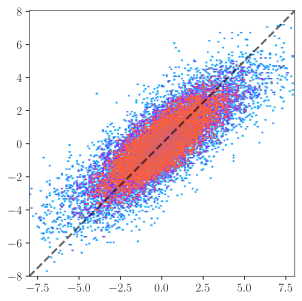

In [143]:
from matplotlib import rc
import matplotlib.font_manager
import seaborn as sns
from scipy import stats
import datashader as ds
from datashader.mpl_ext import dsshow
plt.rcParams["font.family"] = "Times New Roman"
rc('text', usetex=True)

Y_large_test_plot_temp = np.array(Y_small_test_plot)
Y_large_pred_test_plot_temp = np.array(Y_small_pred_test_plot)

# Y_large_test_plot_temp = np.sum(Y_large_test_plot_temp,axis=1).reshape(-1,1)
# Y_large_pred_test_plot_temp = np.sum(Y_large_pred_test_plot_temp,axis=1).reshape(-1,1)

# Y_large_test_plot_temp = np.array(Y_large_test_plot_temp, dtype=float)
# Y_large_pred_test_plot_temp = np.array(Y_large_pred_test_plot_temp, dtype=float)

# dataset = pd.DataFrame({'F_lDNS': Y_large_test_plot_temp.flatten(), 'F_lPINN': Y_large_pred_test_plot_temp.flatten()})


x = np.random.normal(size=100000)
y = x * 3 + np.random.normal(size=100000)

# def using_datashader(ax, x, y):

#     df = pd.DataFrame(dict(x=x, y=y))
#     dsartist = dsshow(
#         df,
#         ds.Point("x", "y"),
#         ds.count(),
#         vmin=0,
#         vmax=35,
#         norm="linear",
#         aspect="auto",
#         ax=ax,
#     )

#     plt.colorbar(dsartist)
    
# using_datashader(ax, Y_large_test_plot_temp[:,0], Y_large_pred_test_plot_temp[:,0])
# using_datashader(ax, x, y)

# plt.show()

# values = np.hstack([Y_large_test_plot_temp, Y_large_pred_test_plot_temp])
# kernel = stats.gaussian_kde(values)(values)
# sns.jointplot(x='F_lDNS', y='F_lPINN', ax=ax1, data=dataset,
#                   kind="reg")
# sns.scatterplot(
#     data=tips,
#     x='F_lDNS',
#     y='F_lPINN',
#     c=kernel,
#     cmap="viridis",
#     ax=ax1,
# )
lim1 = np.mean(Y_large_test_plot_temp[:,0]) - 3.5*np.std(Y_large_test_plot_temp[:,0])
lim2 = np.mean(Y_large_test_plot_temp[:,0]) + 3.5*np.std(Y_large_test_plot_temp[:,0])

import mpl_scatter_density # adds projection='scatter_density'
from matplotlib.colors import LinearSegmentedColormap

white_viridis = LinearSegmentedColormap.from_list('white_viridis', [
    (0, '#ffffff'),
    (1e-20, '#00fff9'),
    (0.025, '#00b8ff'),
    (0.05, '#4900ff'),
    (0.075, '#9600ff'),
    (0.1, '#ff3800'),
    (1, '#98399A'),
], N=256)


N = np.shape(Y_large_test_plot_temp[:,0])
x = np.random.normal(4, 2, N)
y = np.random.normal(3, 1, N)

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
ax.scatter_density(Y_large_test_plot_temp[:,0], Y_large_pred_test_plot_temp[:,0], cmap=white_viridis, alpha=0.8)
ax.plot([lim1, lim2], [lim1, lim2], linestyle='--', color='black', linewidth=2, alpha=0.6)


ax.set_aspect('equal')
ax.set_xlim((1.0*lim1, 1.0*lim2))
ax.set_ylim((1.0*lim1, 1.0*lim2))

plt.show()

## $R^2$ plot of lift/torque

In [47]:
from matplotlib import rc
import matplotlib.font_manager
import seaborn as sns
from scipy import stats
import datashader as ds
from datashader.mpl_ext import dsshow
plt.rcParams["font.family"] = "Times New Roman"
rc('text', usetex=True)

Y_large_test_plot_temp = np.array(Y_small_test_plot)
Y_large_pred_test_plot_temp = np.array(Y_small_pred_test_plot)

Y_large_test_plot_temp = np.sum(Y_large_test_plot_temp,axis=1).reshape(-1,1)
Y_large_pred_test_plot_temp = np.sum(Y_large_pred_test_plot_temp,axis=1).reshape(-1,1)

Y_large_test_plot_temp = np.array(Y_large_test_plot_temp, dtype=float)
Y_large_pred_test_plot_temp = np.array(Y_large_pred_test_plot_temp, dtype=float)

dataset = pd.DataFrame({'F_lDNS': Y_large_test_plot_temp.flatten(), 'F_lPINN': Y_large_pred_test_plot_temp.flatten()})

lim1 = np.mean(Y_small_test_plot) - 3.5*np.std(Y_small_test_plot)
lim2 = np.mean(Y_small_test_plot) + 3.5*np.std(Y_small_test_plot)

fig,(ax1,ax2) = plt.subplots(1,2,sharex=True,sharey=True,figsize=(11,5))
fig.subplots_adjust(wspace=0)

ax1.scatter(Y_large_test_plot_temp, Y_large_pred_test_plot_temp,
                marker='o',
                s=9, linewidth=0.5,
                alpha=0.6,
                edgecolor='lightcoral', facecolor='none')
ax1.plot([lim1, lim2], [lim1, lim2], linestyle='--', color='black', linewidth=2, alpha=0.6)
    
ax1.set_aspect('equal')
ax1.set_xlim((1.0*lim1, 1.0*lim2))
ax1.set_ylim((1.0*lim1, 1.0*lim2))

x_ann = ax1.get_xlim()[1] - 0.02*(plt.xlim()[1]-plt.xlim()[0])
y_ann = ax1.get_ylim()[0] + 0.02*(plt.ylim()[1]-plt.ylim()[0])
ax1.annotate(str(r'Large spheres $R^2 = ' + f'{Average_large_test_scores:.3f} $'), 
                 xy=(x_ann, y_ann),
                 horizontalalignment='right',
                 verticalalignment='bottom',
                 fontsize=18);

ax1.set_xlabel(r'$F_{l,DNS}$',fontsize=20,x=1.05)
ax1.set_ylabel(r'$F_{l,PINN}$',fontsize=20)

ax1.set_title(r'$(Re,\phi,r)=(100,30\%,2)$',fontsize=22,x=1.05,pad=10)

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator, MaxNLocator)
    
ax1.xaxis.set_major_locator(MaxNLocator(5))
ax1.yaxis.set_major_locator(MaxNLocator(5))
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

#=================================================================

# ax2.scatter(Y_small_test_plot, Y_small_pred_test_plot,
#                 marker='o',
#                 s=9, linewidth=0.5,
#                 alpha=0.6,
#                 edgecolor='cornflowerblue', facecolor='none')
ax2.plot([lim1, lim2], [lim1, lim2], linestyle='--', color='black', linewidth=2, alpha=0.6)
    
ax2.set_aspect('equal')

x_ann = ax2.get_xlim()[1] - 0.02*(plt.xlim()[1]-plt.xlim()[0])
y_ann = ax2.get_ylim()[0] + 0.02*(plt.ylim()[1]-plt.ylim()[0])
ax2.annotate(str(r'Small spheres $R^2 = ' + f'{Average_small_test_scores:.3f} $'), 
                 xy=(x_ann, y_ann),
                 horizontalalignment='right',
                 verticalalignment='bottom',
                 fontsize=18);

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator, MaxNLocator)
    
ax2.xaxis.set_tick_params(labelsize=16)

# fig.savefig("Plots/Fl_Re100_phi30_r2.pdf", bbox_inches="tight")

In [16]:
a = np.array([[4,5,6],
              [5,6,7]])
b = np.array([[3,5],
              [4,7]])

print(np.sum(np.square(a),axis=1).reshape(-1,1))
print( K.mean(K.constant(a), axis = 0) )
print( a-K.mean(K.constant(a), axis = 0) )
print( K.square(a[:,:-1] - b) )
print( K.sum(K.square(a[:,:-1] - b),axis=0) )
print( b - K.sum(K.square(a[:,:-1] - b),axis=1) ) 

[[ 77]
 [110]]
tf.Tensor([4.5 5.5 6.5], shape=(3,), dtype=float32)
tf.Tensor(
[[-0.5 -0.5 -0.5]
 [ 0.5  0.5  0.5]], shape=(2, 3), dtype=float32)
tf.Tensor(
[[1 0]
 [1 1]], shape=(2, 2), dtype=int64)
tf.Tensor([2 1], shape=(2,), dtype=int64)
tf.Tensor(
[[2 3]
 [3 5]], shape=(2, 2), dtype=int64)


## Universal Model for darg

In [10]:
%reset -f array
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
sc = StandardScaler()
mc = MinMaxScaler()

# free up memory from previous plots_________________
plt.close('all')
plt.clf()

# load dataset _______________________________________
coord = r'F_x' 
N_cases = 8
Re  = 1
phi = 15
r = 2
n_closest = 101
N_1 = 192
if N_1 == 192: 
    N_2 = 768
    N_set = 20
else:
    N_2 = 1536
    N_set = 10

num_p_incl = 50
N_neurons = 50
epochs = 3000
lr = 1.e-3
verbose = 0
batch_size = 128

# coord, title = 'F_x', r'$ Re = ' + f'{Re},' + r' \phi = ' + f'{phi} $'

dataset = pd.read_csv(f'Datasets/Re{Re}_phi0{phi}_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

col_n = -5

X_in = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
Y_in = np.hstack([dataset[:, [-3]],dataset[:, [-11]]])
N = Y_in.shape[0]
Y_in = np.hstack([Y_in,np.ones((N,1))*int(Re)])
Y_in = np.hstack([Y_in,np.ones((N,1))*int(phi)])
Y_in = np.hstack([Y_in,np.ones((N,1))*int(r)])

#======================================================

Re = 10

dataset = pd.read_csv(f'Datasets/Re{Re}_phi0{phi}_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

X_in_temp = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
Y_in_temp = np.hstack([dataset[:, [-3]],dataset[:, [-11]]])
N = Y_in_temp.shape[0]
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(Re)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(phi)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(r)])

X_in = np.vstack([X_in,X_in_temp])
Y_in = np.vstack([Y_in,Y_in_temp])

#======================================================

Re = 100

dataset = pd.read_csv(f'Datasets/Re{Re}_phi0{phi}_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

X_in_temp = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
Y_in_temp = np.hstack([dataset[:, [-3]],dataset[:, [-11]]])
N = Y_in_temp.shape[0]
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(Re)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(phi)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(r)])

X_in = np.vstack([X_in,X_in_temp])
Y_in = np.vstack([Y_in,Y_in_temp])

#======================================================

Re = 1
phi = 30
N_1 = 384

dataset = pd.read_csv(f'Datasets/Re{Re}_phi0{phi}_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

X_in_temp = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
Y_in_temp = np.hstack([dataset[:, [-3]],dataset[:, [-11]]])
N = Y_in_temp.shape[0]
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(Re)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(phi)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(r)])

X_in = np.vstack([X_in,X_in_temp])
Y_in = np.vstack([Y_in,Y_in_temp])

#======================================================

Re = 10

dataset = pd.read_csv(f'Datasets/Re{Re}_phi0{phi}_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

X_in_temp = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
Y_in_temp = np.hstack([dataset[:, [-3]],dataset[:, [-11]]])
N = Y_in_temp.shape[0]
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(Re)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(phi)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(r)])

X_in = np.vstack([X_in,X_in_temp])
Y_in = np.vstack([Y_in,Y_in_temp])

#======================================================

Re = 100

dataset = pd.read_csv(f'Datasets/Re{Re}_phi0{phi}_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

X_in_temp = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
Y_in_temp = np.hstack([dataset[:, [-3]],dataset[:, [-11]]])
N = Y_in_temp.shape[0]
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(Re)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(phi)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(r)])

X_in = np.vstack([X_in,X_in_temp])
Y_in = np.vstack([Y_in,Y_in_temp])

#======================================================

Re = 10
phi = 40
N_1 = 313
r = 2.5

dataset = pd.read_csv(f'Datasets/Re{Re}_phi0{phi}_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

X_in_temp = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
Y_in_temp = np.hstack([dataset[:, [-3]],dataset[:, [-11]]])
N = Y_in_temp.shape[0]
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(Re)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(phi)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(r)])

X_in = np.vstack([X_in,X_in_temp])
Y_in = np.vstack([Y_in,Y_in_temp])

#======================================================

Re = 10
phi = 20
N_1 = 453
r = 1.5

dataset = pd.read_csv(f'Datasets/Re{Re}_phi0{phi}_M={n_closest}_{N_1}L',
                        header=None, delim_whitespace=True).values

X_in_temp = dataset[:, :-6]
# X_in = np.delete(X_in,col_n,1)
Y_in_temp = np.hstack([dataset[:, [-3]],dataset[:, [-11]]])
N = Y_in_temp.shape[0]
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(Re)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(phi)])
Y_in_temp = np.hstack([Y_in_temp,np.ones((N,1))*int(r)])

X_in = np.vstack([X_in,X_in_temp])
Y_in = np.vstack([Y_in,Y_in_temp])

X_large = X_in[X_in[:,col_n]>0.6]
Y_large = Y_in[X_in[:,col_n]>0.6]
V_large = X_large[:,col_n:]
X_small = X_in[X_in[:,col_n]<0.6]
Y_small = Y_in[X_in[:,col_n]<0.6]
V_small = X_small[:,col_n:]
    
N_folds = 5   
kf = KFold(n_splits=N_folds, shuffle=True)

large_train_scores = np.zeros((N_cases,N_folds))
small_train_scores = np.zeros((N_cases,N_folds))
large_test_scores = np.zeros((N_cases,N_folds))
small_test_scores = np.zeros((N_cases,N_folds))

X_test_plot = np.zeros((0, X_in.shape[1]))
Y_large_test_plot = np.zeros((0, 1))
Y_small_test_plot = np.zeros((0, 1))
Y_large_pred_test_plot = np.zeros((0, 1))
Y_small_pred_test_plot = np.zeros((0, 1))

print('Input shape:', X_in.shape)
print(f'# of neighbors in the dataset = {int((X_in.shape[1] - 5) / 4)}')
print(f'# of neighbors used for training = {num_p_incl}')
print('________________________________________')

q = -1
# Train-Test split for K-fold cross-validation _______________________________________
for train_index, test_index in kf.split(X_in):
    
    q += 1
    # if q == 1: break

    X_train_list = []
    X_test_list = []
    
    p_input_list = []
    p_out_list = []
    
    X_train, X_test = X_in[train_index], X_in[test_index]
    Y_train, Y_test = Y_in[train_index], Y_in[test_index]
            
    V_in_train = X_train[:, col_n:]
    V_in_test  = X_test[:, col_n:]
    
    '''
    Dataset 1: (Re,phi,r) = (1,15%,2)
    '''
    condition = np.logical_and(X_train[:,col_n]>0.6,Y_train[:,-3]==1)
    condition = np.logical_and(condition,Y_train[:,-2]==15)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_large_in_train_1 = X_train[condition]
    Y_large_in_train_1 = Y_train[condition]
    V_large_in_train_1 = X_large_in_train_1[:,col_n:]
    condition = np.logical_and(X_train[:,col_n]<0.6,Y_train[:,-3]==1)
    condition = np.logical_and(condition,Y_train[:,-2]==15)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_small_in_train_1 = X_train[condition]
    Y_small_in_train_1 = Y_train[condition]
    V_small_in_train_1 = X_small_in_train_1[:,col_n:]
    
    condition = np.logical_and(X_test[:,col_n]>0.6,Y_test[:,-3]==1)
    condition = np.logical_and(condition,Y_test[:,-2]==15)
    condition = np.logical_and(condition,Y_test[:,-1]==2)
    X_large_in_test_1 = X_test[condition]
    Y_large_in_test_1 = Y_test[condition]
    V_large_in_test_1 = X_large_in_test_1[:,col_n:]
    condition = np.logical_and(X_test[:,col_n]<0.6,Y_test[:,-3]==1)
    condition = np.logical_and(condition,Y_test[:,-2]==15)
    condition = np.logical_and(condition,Y_test[:,-1]==2)                          
    X_small_in_test_1 = X_test[condition]
    Y_small_in_test_1 = Y_test[condition]
    V_small_in_test_1 = X_small_in_test_1[:,col_n:]
        
    '''
    Dataset 2: (Re,phi,r) = (10,15%,2)
    '''
    condition = np.logical_and(X_train[:,col_n]>0.6,Y_train[:,-3]==10)
    condition = np.logical_and(condition,Y_train[:,-2]==15)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_large_in_train_2 = X_train[condition]
    Y_large_in_train_2 = Y_train[condition]
    V_large_in_train_2 = X_large_in_train_2[:,col_n:]
    condition = np.logical_and(X_train[:,col_n]<0.6,Y_train[:,-3]==10)
    condition = np.logical_and(condition,Y_train[:,-2]==15)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_small_in_train_2 = X_train[condition]
    Y_small_in_train_2 = Y_train[condition]
    V_small_in_train_2 = X_small_in_train_2[:,col_n:]
    
    condition = np.logical_and(X_test[:,col_n]>0.6,Y_test[:,-3]==10)
    condition = np.logical_and(condition,Y_test[:,-2]==15)
    condition = np.logical_and(condition,Y_test[:,-1]==2)
    X_large_in_test_2 = X_test[condition]
    Y_large_in_test_2 = Y_test[condition]
    V_large_in_test_2 = X_large_in_test_2[:,col_n:]
    condition = np.logical_and(X_test[:,col_n]<0.6,Y_test[:,-3]==10)
    condition = np.logical_and(condition,Y_test[:,-2]==15)
    condition = np.logical_and(condition,Y_test[:,-1]==2)                          
    X_small_in_test_2 = X_test[condition]
    Y_small_in_test_2 = Y_test[condition]
    V_small_in_test_2 = X_small_in_test_2[:,col_n:]
        
    '''
    Dataset 3: (Re,phi,r) = (100,15%,2)
    '''
    condition = np.logical_and(X_train[:,col_n]>0.6,Y_train[:,-3]==100)
    condition = np.logical_and(condition,Y_train[:,-2]==15)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_large_in_train_3 = X_train[condition]
    Y_large_in_train_3 = Y_train[condition]
    V_large_in_train_3 = X_large_in_train_3[:,col_n:]
    condition = np.logical_and(X_train[:,col_n]<0.6,Y_train[:,-3]==100)
    condition = np.logical_and(condition,Y_train[:,-2]==15)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_small_in_train_3 = X_train[condition]
    Y_small_in_train_3 = Y_train[condition]
    V_small_in_train_3 = X_small_in_train_3[:,col_n:]
    
    condition = np.logical_and(X_test[:,col_n]>0.6,Y_test[:,-3]==100)
    condition = np.logical_and(condition,Y_test[:,-2]==15)
    condition = np.logical_and(condition,Y_test[:,-1]==2)
    X_large_in_test_3 = X_test[condition]
    Y_large_in_test_3 = Y_test[condition]
    V_large_in_test_3 = X_large_in_test_3[:,col_n:]
    condition = np.logical_and(X_test[:,col_n]<0.6,Y_test[:,-3]==100)
    condition = np.logical_and(condition,Y_test[:,-2]==15)
    condition = np.logical_and(condition,Y_test[:,-1]==2)                          
    X_small_in_test_3 = X_test[condition]
    Y_small_in_test_3 = Y_test[condition]
    V_small_in_test_3 = X_small_in_test_3[:,col_n:]
            
    '''
    Dataset 4: (Re,phi,r) = (1,30%,2)
    '''
    condition = np.logical_and(X_train[:,col_n]>0.6,Y_train[:,-3]==1)
    condition = np.logical_and(condition,Y_train[:,-2]==30)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_large_in_train_4 = X_train[condition]
    Y_large_in_train_4 = Y_train[condition]
    V_large_in_train_4 = X_large_in_train_4[:,col_n:]
    condition = np.logical_and(X_train[:,col_n]<0.6,Y_train[:,-3]==1)
    condition = np.logical_and(condition,Y_train[:,-2]==30)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_small_in_train_4 = X_train[condition]
    Y_small_in_train_4 = Y_train[condition]
    V_small_in_train_4 = X_small_in_train_4[:,col_n:]
    
    condition = np.logical_and(X_test[:,col_n]>0.6,Y_test[:,-3]==1)
    condition = np.logical_and(condition,Y_test[:,-2]==30)
    condition = np.logical_and(condition,Y_test[:,-1]==2)
    X_large_in_test_4 = X_test[condition]
    Y_large_in_test_4 = Y_test[condition]
    V_large_in_test_4 = X_large_in_test_4[:,col_n:]
    condition = np.logical_and(X_test[:,col_n]<0.6,Y_test[:,-3]==1)
    condition = np.logical_and(condition,Y_test[:,-2]==30)
    condition = np.logical_and(condition,Y_test[:,-1]==2)                          
    X_small_in_test_4 = X_test[condition]
    Y_small_in_test_4 = Y_test[condition]
    V_small_in_test_4 = X_small_in_test_4[:,col_n:]
        
    '''
    Dataset 5: (Re,phi,r) = (10,30%,2)
    '''
    condition = np.logical_and(X_train[:,col_n]>0.6,Y_train[:,-3]==10)
    condition = np.logical_and(condition,Y_train[:,-2]==30)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_large_in_train_5 = X_train[condition]
    Y_large_in_train_5 = Y_train[condition]
    V_large_in_train_5 = X_large_in_train_5[:,col_n:]
    condition = np.logical_and(X_train[:,col_n]<0.6,Y_train[:,-3]==10)
    condition = np.logical_and(condition,Y_train[:,-2]==30)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_small_in_train_5 = X_train[condition]
    Y_small_in_train_5 = Y_train[condition]
    V_small_in_train_5 = X_small_in_train_5[:,col_n:]
    
    condition = np.logical_and(X_test[:,col_n]>0.6,Y_test[:,-3]==10)
    condition = np.logical_and(condition,Y_test[:,-2]==30)
    condition = np.logical_and(condition,Y_test[:,-1]==2)
    X_large_in_test_5 = X_test[condition]
    Y_large_in_test_5 = Y_test[condition]
    V_large_in_test_5 = X_large_in_test_5[:,col_n:]
    condition = np.logical_and(X_test[:,col_n]<0.6,Y_test[:,-3]==10)
    condition = np.logical_and(condition,Y_test[:,-2]==30)
    condition = np.logical_and(condition,Y_test[:,-1]==2)                          
    X_small_in_test_5 = X_test[condition]
    Y_small_in_test_5 = Y_test[condition]
    V_small_in_test_5 = X_small_in_test_5[:,col_n:]
    
    '''
    Dataset 6: (Re,phi,r) = (100,30%,2)
    '''
    condition = np.logical_and(X_train[:,col_n]>0.6,Y_train[:,-3]==100)
    condition = np.logical_and(condition,Y_train[:,-2]==30)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_large_in_train_6 = X_train[condition]
    Y_large_in_train_6 = Y_train[condition]
    V_large_in_train_6 = X_large_in_train_6[:,col_n:]
    condition = np.logical_and(X_train[:,col_n]<0.6,Y_train[:,-3]==100)
    condition = np.logical_and(condition,Y_train[:,-2]==30)
    condition = np.logical_and(condition,Y_train[:,-1]==2)
    X_small_in_train_6 = X_train[condition]
    Y_small_in_train_6 = Y_train[condition]
    V_small_in_train_6 = X_small_in_train_6[:,col_n:]
    
    condition = np.logical_and(X_test[:,col_n]>0.6,Y_test[:,-3]==100)
    condition = np.logical_and(condition,Y_test[:,-2]==30)
    condition = np.logical_and(condition,Y_test[:,-1]==2)
    X_large_in_test_6 = X_test[condition]
    Y_large_in_test_6 = Y_test[condition]
    V_large_in_test_6 = X_large_in_test_6[:,col_n:]
    condition = np.logical_and(X_test[:,col_n]<0.6,Y_test[:,-3]==100)
    condition = np.logical_and(condition,Y_test[:,-2]==30)
    condition = np.logical_and(condition,Y_test[:,-1]==2)                          
    X_small_in_test_6 = X_test[condition]
    Y_small_in_test_6 = Y_test[condition]
    V_small_in_test_6 = X_small_in_test_6[:,col_n:]
    
    '''
    Dataset 7: (Re,phi,r) = (10,40%,2.5)
    '''
    condition = np.logical_and(X_train[:,col_n]>0.6,Y_train[:,-3]==10)
    condition = np.logical_and(condition,Y_train[:,-2]==40)
    # condition = np.logical_and(condition,Y_train[:,-1]==2.5)
    X_large_in_train_7 = X_train[condition]
    Y_large_in_train_7 = Y_train[condition]
    V_large_in_train_7 = X_large_in_train_7[:,col_n:]
    condition = np.logical_and(X_train[:,col_n]<0.6,Y_train[:,-3]==10)
    condition = np.logical_and(condition,Y_train[:,-2]==40)
    # condition = np.logical_and(condition,Y_train[:,-1]==2.5)
    X_small_in_train_7 = X_train[condition]
    Y_small_in_train_7 = Y_train[condition]
    V_small_in_train_7 = X_small_in_train_7[:,col_n:]
    
    condition = np.logical_and(X_test[:,col_n]>0.6,Y_test[:,-3]==10)
    condition = np.logical_and(condition,Y_test[:,-2]==40)
    # condition = np.logical_and(condition,Y_test[:,-1]==2.5)
    X_large_in_test_7 = X_test[condition]
    Y_large_in_test_7 = Y_test[condition]
    V_large_in_test_7 = X_large_in_test_7[:,col_n:]
    condition = np.logical_and(X_test[:,col_n]<0.6,Y_test[:,-3]==10)
    condition = np.logical_and(condition,Y_test[:,-2]==40)
    # condition = np.logical_and(condition,Y_test[:,-1]==2.5)                          
    X_small_in_test_7 = X_test[condition]
    Y_small_in_test_7 = Y_test[condition]
    V_small_in_test_7 = X_small_in_test_7[:,col_n:]
    
    '''
    Dataset 8: (Re,phi,r) = (10,20%,1.5)
    '''
    condition = np.logical_and(X_train[:,col_n]>0.6,Y_train[:,-3]==10)
    condition = np.logical_and(condition,Y_train[:,-2]==20)
    # condition = np.logical_and(condition,Y_train[:,-1]==1.5)
    X_large_in_train_8 = X_train[condition]
    Y_large_in_train_8 = Y_train[condition]
    V_large_in_train_8 = X_large_in_train_8[:,col_n:]
    condition = np.logical_and(X_train[:,col_n]<0.6,Y_train[:,-3]==10)
    condition = np.logical_and(condition,Y_train[:,-2]==20)
    # condition = np.logical_and(condition,Y_train[:,-1]==1.5)
    X_small_in_train_8 = X_train[condition]
    Y_small_in_train_8 = Y_train[condition]
    V_small_in_train_8 = X_small_in_train_8[:,col_n:]
    
    condition = np.logical_and(X_test[:,col_n]>0.6,Y_test[:,-3]==10)
    condition = np.logical_and(condition,Y_test[:,-2]==20)
    # condition = np.logical_and(condition,Y_test[:,-1]==1.5)
    X_large_in_test_8 = X_test[condition]
    Y_large_in_test_8 = Y_test[condition]
    V_large_in_test_8 = X_large_in_test_8[:,col_n:]
    condition = np.logical_and(X_test[:,col_n]<0.6,Y_test[:,-3]==10)
    condition = np.logical_and(condition,Y_test[:,-2]==20)
    # condition = np.logical_and(condition,Y_test[:,-1]==1.5)                          
    X_small_in_test_8 = X_test[condition]
    Y_small_in_test_8 = Y_test[condition]
    V_small_in_test_8 = X_small_in_test_8[:,col_n:]
    
    # V_max_in_train = np.max(V_in_train[:,-3:])
    # V_in_train[:,-3:] /= V_max_in_train
    # V_in_test[:,-3:] /= V_max_in_train
    # V_large_in_train_1[:,-3:] /= V_max_in_train
    # V_small_in_train_1[:,-3:] /= V_max_in_train
    # V_large_in_test_1[:,-3:] /= V_max_in_train
    # V_small_in_test_1[:,-3:] /= V_max_in_train
    # V_large_in_train_2[:,-3:] /= V_max_in_train
    # V_small_in_train_2[:,-3:] /= V_max_in_train
    # V_large_in_test_2[:,-3:] /= V_max_in_train
    # V_small_in_test_2[:,-3:] /= V_max_in_train
    # V_large_in_train_3[:,-3:] /= V_max_in_train
    # V_small_in_train_3[:,-3:] /= V_max_in_train
    # V_large_in_test_3[:,-3:] /= V_max_in_train
    # V_small_in_test_3[:,-3:] /= V_max_in_train
    # V_large_in_train_4[:,-3:] /= V_max_in_train
    # V_small_in_train_4[:,-3:] /= V_max_in_train
    # V_large_in_test_4[:,-3:] /= V_max_in_train
    # V_small_in_test_4[:,-3:] /= V_max_in_train
    # V_large_in_train_5[:,-3:] /= V_max_in_train
    # V_small_in_train_5[:,-3:] /= V_max_in_train
    # V_large_in_test_5[:,-3:] /= V_max_in_train
    # V_small_in_test_5[:,-3:] /= V_max_in_train
    # V_large_in_train_6[:,-3:] /= V_max_in_train
    # V_small_in_train_6[:,-3:] /= V_max_in_train
    # V_large_in_test_6[:,-3:] /= V_max_in_train
    # V_small_in_test_6[:,-3:] /= V_max_in_train
    
    '''
    Integrate all the datasets
    '''
    X_large_in_train = [X_large_in_train_1,X_large_in_train_2,X_large_in_train_3,X_large_in_train_4,X_large_in_train_5,X_large_in_train_6,X_large_in_train_7,X_large_in_train_8]
    X_small_in_train = [X_small_in_train_1,X_small_in_train_2,X_small_in_train_3,X_small_in_train_4,X_small_in_train_5,X_small_in_train_6,X_small_in_train_7,X_small_in_train_8]
    X_large_in_test = [X_large_in_test_1,X_large_in_test_2,X_large_in_test_3,X_large_in_test_4,X_large_in_test_5,X_large_in_test_6,X_large_in_test_7,X_large_in_test_8]
    X_small_in_test = [X_small_in_test_1,X_small_in_test_2,X_small_in_test_3,X_small_in_test_4,X_small_in_test_5,X_small_in_test_6,X_small_in_test_7,X_small_in_test_8]
    Y_large_in_train = [Y_large_in_train_1,Y_large_in_train_2,Y_large_in_train_3,Y_large_in_train_4,Y_large_in_train_5,Y_large_in_train_6,Y_large_in_train_7,Y_large_in_train_8]
    Y_small_in_train = [Y_small_in_train_1,Y_small_in_train_2,Y_small_in_train_3,Y_small_in_train_4,Y_small_in_train_5,Y_small_in_train_6,Y_small_in_train_7,Y_small_in_train_8]
    Y_large_in_test = [Y_large_in_test_1,Y_large_in_test_2,Y_large_in_test_3,Y_large_in_test_4,Y_large_in_test_5,Y_large_in_test_6,Y_large_in_test_7,Y_large_in_test_8]
    Y_small_in_test = [Y_small_in_test_1,Y_small_in_test_2,Y_small_in_test_3,Y_small_in_test_4,Y_small_in_test_5,Y_small_in_test_6,Y_small_in_test_7,Y_small_in_test_8]
    V_large_in_train = [V_large_in_train_1,V_large_in_train_2,V_large_in_train_3,V_large_in_train_4,V_large_in_train_5,V_large_in_train_6,V_large_in_train_7,V_large_in_train_8]
    V_small_in_train = [V_small_in_train_1,V_small_in_train_2,V_small_in_train_3,V_small_in_train_4,V_small_in_train_5,V_small_in_train_6,V_small_in_train_7,V_small_in_train_8]
    V_large_in_test = [V_large_in_test_1,V_large_in_test_2,V_large_in_test_3,V_large_in_test_4,V_large_in_test_5,V_large_in_test_6,V_large_in_test_7,V_large_in_test_8]
    V_small_in_test = [V_small_in_test_1,V_small_in_test_2,V_small_in_test_3,V_small_in_test_4,V_small_in_test_5,V_small_in_test_6,V_small_in_test_7,V_small_in_test_8]
        
    print("===========Number of samples in each sets===========")
    print("++Training set++")
    print(f'Case 1 large: {X_large_in_train_1.shape[0]}')
    print(f'Case 1 small: {X_small_in_train_1.shape[0]}')
    print(f'Case 2 large: {X_large_in_train_2.shape[0]}')
    print(f'Case 2 small: {X_small_in_train_2.shape[0]}')
    print(f'Case 3 large: {X_large_in_train_3.shape[0]}')
    print(f'Case 3 small: {X_small_in_train_3.shape[0]}')
    print(f'Case 4 large: {X_large_in_train_4.shape[0]}')
    print(f'Case 4 small: {X_small_in_train_4.shape[0]}')
    print(f'Case 5 large: {X_large_in_train_5.shape[0]}')
    print(f'Case 5 small: {X_small_in_train_5.shape[0]}')
    print(f'Case 6 large: {X_large_in_train_6.shape[0]}')
    print(f'Case 6 small: {X_small_in_train_6.shape[0]}')
    print(f'Case 7 large: {X_large_in_train_7.shape[0]}')
    print(f'Case 7 small: {X_small_in_train_7.shape[0]}')
    print(f'Case 8 large: {X_large_in_train_8.shape[0]}')
    print(f'Case 8 small: {X_small_in_train_8.shape[0]}')
    print("++Test set++")
    print(f'Case 1 large: {X_large_in_test_1.shape[0]}')
    print(f'Case 1 small: {X_small_in_test_1.shape[0]}')
    print(f'Case 2 large: {X_large_in_test_2.shape[0]}')
    print(f'Case 2 small: {X_small_in_test_2.shape[0]}')
    print(f'Case 3 large: {X_large_in_test_3.shape[0]}')
    print(f'Case 3 small: {X_small_in_test_3.shape[0]}')
    print(f'Case 4 large: {X_large_in_test_4.shape[0]}')
    print(f'Case 4 small: {X_small_in_test_4.shape[0]}')
    print(f'Case 5 large: {X_large_in_test_5.shape[0]}')
    print(f'Case 5 small: {X_small_in_test_5.shape[0]}')
    print(f'Case 6 large: {X_large_in_test_6.shape[0]}')
    print(f'Case 6 small: {X_small_in_test_6.shape[0]}')
    print(f'Case 7 large: {X_large_in_test_7.shape[0]}')
    print(f'Case 7 small: {X_small_in_test_7.shape[0]}')
    print(f'Case 8 large: {X_large_in_test_8.shape[0]}')
    print(f'Case 8 small: {X_small_in_test_8.shape[0]}')
    
    print("===========Average force/torque===========")
    print("++Training set++")
    print(f'Case 1 large: {np.mean(Y_large_in_train_1[:,0])}')
    print(f'Case 1 small: {np.mean(Y_small_in_train_1[:,0])}')
    print(f'Case 2 large: {np.mean(Y_large_in_train_2[:,0])}')
    print(f'Case 2 small: {np.mean(Y_small_in_train_2[:,0])}')
    print(f'Case 3 large: {np.mean(Y_large_in_train_3[:,0])}')
    print(f'Case 3 small: {np.mean(Y_small_in_train_3[:,0])}')
    print(f'Case 4 large: {np.mean(Y_large_in_train_4[:,0])}')
    print(f'Case 4 small: {np.mean(Y_small_in_train_4[:,0])}')
    print(f'Case 5 large: {np.mean(Y_large_in_train_5[:,0])}')
    print(f'Case 5 small: {np.mean(Y_small_in_train_5[:,0])}')
    print(f'Case 6 large: {np.mean(Y_large_in_train_6[:,0])}')
    print(f'Case 6 small: {np.mean(Y_small_in_train_6[:,0])}')
    print(f'Case 7 large: {np.mean(Y_large_in_train_7[:,0])}')
    print(f'Case 7 small: {np.mean(Y_small_in_train_7[:,0])}')
    print(f'Case 8 large: {np.mean(Y_large_in_train_8[:,0])}')
    print(f'Case 8 small: {np.mean(Y_small_in_train_8[:,0])}')
    print("++Test set++")
    print(f'Case 1 large: {np.mean(Y_large_in_test_1[:,0])}')
    print(f'Case 1 small: {np.mean(Y_small_in_test_1[:,0])}')
    print(f'Case 2 large: {np.mean(Y_large_in_test_2[:,0])}')
    print(f'Case 2 small: {np.mean(Y_small_in_test_2[:,0])}')
    print(f'Case 3 large: {np.mean(Y_large_in_test_3[:,0])}')
    print(f'Case 3 small: {np.mean(Y_small_in_test_3[:,0])}')
    print(f'Case 4 large: {np.mean(Y_large_in_test_4[:,0])}')
    print(f'Case 4 small: {np.mean(Y_small_in_test_4[:,0])}')
    print(f'Case 5 large: {np.mean(Y_large_in_test_5[:,0])}')
    print(f'Case 5 small: {np.mean(Y_small_in_test_5[:,0])}')
    print(f'Case 6 large: {np.mean(Y_large_in_test_6[:,0])}')
    print(f'Case 6 small: {np.mean(Y_small_in_test_6[:,0])}')
    print(f'Case 7 large: {np.mean(Y_large_in_test_7[:,0])}')
    print(f'Case 7 small: {np.mean(Y_small_in_test_7[:,0])}')
    print(f'Case 8 large: {np.mean(Y_large_in_test_8[:,0])}')
    print(f'Case 8 small: {np.mean(Y_small_in_test_8[:,0])}')
    
    # V_max_in_train = np.max(V_in_train[:,-3:])
    # V_in_train[:,-3:] /= V_max_in_train
    # V_large_in_train[:,-3:] /= V_max_in_train
    # V_small_in_train[:,-3:] /= V_max_in_train
    # V_max_in_test = np.max(V_in_test[:,-3:])
    # V_in_test[:,-3:] /= V_max_in_test
    # V_large_in_test[:,-3:] /= V_max_in_test
    # V_small_in_test[:,-3:] /= V_max_in_test
    # print(V_max_in_train,V_max_in_test)
    
    # Training =======================================
    glorot = tf.keras.initializers.GlorotNormal()
    
    # Custom neural network _______________________________________
    p_shared_layer1 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared1')
    
    p_shared_layer2 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared2')
    
    p_shared_layer3 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared3')
    
    p_shared_layer4 = Dense(N_neurons,
                            activation='tanh',
                            kernel_initializer=glorot,
                            name='p_shared4')
    
#     p_shared_layer5 = Dense(N_neurons,
#                             activation='tanh',
#                             kernel_initializer=glorot,
#                             name='p_shared5')
    
    V_input = Input(shape=V_in_train.shape[1], name='V_in')
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer1')(V_input)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer2')(V_layer)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer3')(V_layer)
    
    V_layer = Dense(N_neurons,
                     activation='relu',
                     kernel_initializer=glorot,
                     name='V_layer4')(V_layer)
    
#     V_layer = Dense(N_neurons,
#                      activation='relu',
#                      kernel_initializer=glorot,
#                      name='V_layer5')(V_layer)
    
    def summation(p_tensor):
        '''
        Each individual neighbor contribution to drag is
        always directed along the x-direction.
        '''
        # Drag _______________________________________
        return tf.reduce_sum(p_tensor, axis=1, keepdims=True)
    #_______________________________________________________________________________

    for p in range(0, num_p_incl):
        X_train_list.append( X_train[:, 4*p:4*p+4])
        p_input_list.append( Input(shape=4, name=f'p_r{p}') )
        # p_out_list.append( tf.keras.layers.Multiply()([tf.keras.layers.Multiply()
        #                   ([p_shared_layer2(p_shared_layer1(p_input_list[p])),V_layer])
        #                                                ,R_input]) )
        # p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer2(p_shared_layer1(p_input_list[p]))
        #                                                ,V_layer]) )
        # p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer3(p_shared_layer2(p_shared_layer1(p_input_list[p])))
        #                                                ,V_layer]) )
        p_out_list.append( tf.keras.layers.Multiply()([p_shared_layer4(p_shared_layer3(p_shared_layer2(p_shared_layer1(p_input_list[p]))))
                                                       ,V_layer]) )

    concat = Concatenate()(
        [Lambda(summation, name=f'summation{j}')(p_out_list[j])\
        for j in range(num_p_incl)])
    
    nonneg = tf.keras.constraints.NonNeg()

    output_layer = Dense(1,
                        activation='linear',
                        kernel_constraint=nonneg,
                        name='out_x',
                        use_bias=False
                        )(concat)
    
    # Trainning _______________________________________

#     def R2(y_true, y_pred):
#         '''
#         This function computes the R^2 for the callback function.
#         '''
#         tf.convert_to_tensor(y_true, dtype=float)
        
#         print(y_true)

#         SS_res = K.sum(K.square(y_true[:,1] - y_pred)) 
        
#         condition = tf.logical_and(y_true[:,-3]==1,y_true[:,-2]==15)
#         condition = tf.logical_and(condition,y_true[:,-1]==2)
#         condition_large = tf.logical_and(condition,y_true[:,-4]>0.6)
#         condition_small = tf.logical_and(condition,y_true[:,-4]<0.6)
#         SS_tot_large_1 = K.sum(K.square(y_true[condition_large,[0]] - K.mean(K.constant(y_true[condition_large,[0]])))) 
#         SS_tot_small_1 = K.sum(K.square(y_true[condition_small,[0]] - K.mean(K.constant(y_true[condition_small,[0]])))) 
        
#         condition = tf.logical_and(y_true[:,-3]==10,y_true[:,-2]==15)
#         condition = tf.logical_and(condition,y_true[:,-1]==2)
#         condition_large = tf.logical_and(condition,y_true[:,-4]>0.6)
#         condition_small = tf.logical_and(condition,y_true[:,-4]<0.6)
#         SS_tot_large_2 = K.sum(K.square(y_true[condition_large,[0]] - K.mean(K.constant(y_true[condition_large,[0]])))) 
#         SS_tot_small_2 = K.sum(K.square(y_true[condition_small,[0]] - K.mean(K.constant(y_true[condition_small,[0]])))) 
        
#         condition = tf.logical_and(y_true[:,-3]==100,y_true[:,-2]==15)
#         condition = tf.logical_and(condition,y_true[:,-1]==2)
#         condition_large = tf.logical_and(condition,y_true[:,-4]>0.6)
#         condition_small = tf.logical_and(condition,y_true[:,-4]<0.6)
#         SS_tot_large_3 = K.sum(K.square(y_true[condition_large,[0]] - K.mean(K.constant(y_true[condition_large,[0]])))) 
#         SS_tot_small_3 = K.sum(K.square(y_true[condition_small,[0]] - K.mean(K.constant(y_true[condition_small,[0]])))) 
        
#         condition = tf.logical_and(y_true[:,-3]==1,y_true[:,-2]==30)
#         condition = tf.logical_and(condition,y_true[:,-1]==2)
#         condition_large = tf.logical_and(condition,y_true[:,-4]>0.6)
#         condition_small = tf.logical_and(condition,y_true[:,-4]<0.6)
#         SS_tot_large_4 = K.sum(K.square(y_true[condition_large,[0]] - K.mean(K.constant(y_true[condition_large,[0]])))) 
#         SS_tot_small_4 = K.sum(K.square(y_true[condition_small,[0]] - K.mean(K.constant(y_true[condition_small,[0]])))) 
        
#         condition = tf.logical_and(y_true[:,-3]==10,y_true[:,-2]==30)
#         condition = tf.logical_and(condition,y_true[:,-1]==2)
#         condition_large = tf.logical_and(condition,y_true[:,-4]>0.6)
#         condition_small = tf.logical_and(condition,y_true[:,-4]<0.6)
#         SS_tot_large_5 = K.sum(K.square(y_true[condition_large,[0]] - K.mean(K.constant(y_true[condition_large,[0]])))) 
#         SS_tot_small_5 = K.sum(K.square(y_true[condition_small,[0]] - K.mean(K.constant(y_true[condition_small,[0]])))) 
        
#         condition = tf.logical_and(y_true[:,-3]==100,y_true[:,-2]==30)
#         condition = tf.logical_and(condition,y_true[:,-1]==2)
#         condition_large = tf.logical_and(condition,y_true[:,-4]>0.6)
#         condition_small = tf.logical_and(condition,y_true[:,-4]<0.6)
#         SS_tot_large_6 = K.sum(K.square(y_true[condition_large,[0]] - K.mean(K.constant(y_true[condition_large,[0]])))) 
#         SS_tot_small_6 = K.sum(K.square(y_true[condition_small,[0]] - K.mean(K.constant(y_true[condition_small,[0]])))) 
        
#         SS_res = tf.cast(SS_res, tf.float32)
#         SS_tot_large_1 = tf.cast(SS_tot_large_1, tf.float32)
#         SS_tot_small_1 = tf.cast(SS_tot_small_1, tf.float32)
#         SS_tot_large_2 = tf.cast(SS_tot_large_2, tf.float32)
#         SS_tot_small_2 = tf.cast(SS_tot_small_2, tf.float32)
#         SS_tot_large_3 = tf.cast(SS_tot_large_3, tf.float32)
#         SS_tot_small_3 = tf.cast(SS_tot_small_3, tf.float32)
#         SS_tot_large_4 = tf.cast(SS_tot_large_4, tf.float32)
#         SS_tot_small_4 = tf.cast(SS_tot_small_4, tf.float32)
#         SS_tot_large_5 = tf.cast(SS_tot_large_5, tf.float32)
#         SS_tot_small_5 = tf.cast(SS_tot_small_5, tf.float32)
#         SS_tot_large_6 = tf.cast(SS_tot_large_6, tf.float32)
#         SS_tot_small_6 = tf.cast(SS_tot_small_6, tf.float32)
        
#         SS_sum = SS_tot_large_1 + SS_tot_small_1 + SS_tot_large_2 + SS_tot_small_2 + SS_tot_large_3 + SS_tot_small_3
#         SS_sum += SS_tot_large_4 + SS_tot_small_4 + SS_tot_large_5 + SS_tot_small_5 + SS_tot_large_6 + SS_tot_small_6
        
#         return 1 - SS_res / (SS_sum + K.epsilon())

    def R2(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res =  K.sum(K.square(y_true - y_pred)) 
        SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
        return 1 - SS_res / (SS_tot + K.epsilon())
    
    def R2_val(y_true, y_pred):
        '''
        This function computes the R^2 for the callback function.
        '''
        SS_res = K.sum(K.square(y_true - y_pred)) 
        SS_tot = K.sum(K.square(y_true - K.mean(y_true)))
        return 1 - SS_res / (SS_tot + K.epsilon())
    
    model = Model(inputs=p_input_list + [V_input], outputs=output_layer)

    myoptimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    mycallback = EarlyStopping(monitor='val_loss', patience=100)

    model.compile(loss='mse', optimizer=myoptimizer, metrics=R2)
    
    history = model.fit(
                        X_train_list + [V_in_train],
                        Y_train[:,[0]],

                        validation_split=0.2,
                        shuffle=True,
                        epochs=epochs,
                        verbose=verbose,
                        batch_size=batch_size,
                        callbacks=[mycallback],
                        )
    
    Y_pred = model.predict(X_train_list + [V_in_train])
    # print(f'Train R^2\t= {R2(Y_train, Y_pred):.3f}\n')
    
    # Testing =======================================
    for p in range(0, num_p_incl):
        X_test_list.append( X_test[:, 4*p:4*p+4] )

    Y_pred_test = model.predict(X_test_list + [V_in_test])
    # print(f'Test R^2\t= {R2(Y_test, Y_pred_test):.3f}\n')
    
    # Validating ====================================
    
    for i in range(N_cases):
        X_large_in_train_list = []
        X_small_in_train_list = []
        X_large_in_test_list = []
        X_small_in_test_list = []
        for p in range(0, num_p_incl):
            X_large_in_train_list.append( X_large_in_train[i][:, 4*p:4*p+4] )

        Y_large_train = model.predict(X_large_in_train_list + [V_large_in_train[i]])
    
        print(f'Case {i+1}: Large Train R^2\t= {R2_val(K.constant(Y_large_in_train[i][:,[0]]), K.constant(Y_large_train)):.3f}\n')
        large_train_scores[i,q] = R2_val(K.constant(Y_large_in_train[i][:,[0]]), K.constant(Y_large_train))
    
        for p in range(0, num_p_incl):
            X_small_in_train_list.append( X_small_in_train[i][:, 4*p:4*p+4] )

        Y_small_train = model.predict(X_small_in_train_list + [V_small_in_train[i]])
    
        print(f'Case {i+1}: Small Train R^2\t= {R2_val(K.constant(Y_small_in_train[i][:,[0]]), K.constant(Y_small_train)):.3f}\n')
        small_train_scores[i,q] = R2_val(K.constant(Y_small_in_train[i][:,[0]]), K.constant(Y_small_train))
    
        for p in range(0, num_p_incl):
            X_large_in_test_list.append( X_large_in_test[i][:, 4*p:4*p+4] )

        Y_large_test = model.predict(X_large_in_test_list + [V_large_in_test[i]])
    
        print(f'Case {i+1}: Large Test R^2\t= {R2_val(K.constant(Y_large_in_test[i][:,[0]]), K.constant(Y_large_test)):.3f}\n')
        large_test_scores[i,q] = R2_val(K.constant(Y_large_in_test[i][:,[0]]), K.constant(Y_large_test))
    
        for p in range(0, num_p_incl):
            X_small_in_test_list.append( X_small_in_test[i][:, 4*p:4*p+4] )

        Y_small_test = model.predict(X_small_in_test_list + [V_small_in_test[i]])
    
        print(f'Case {i+1}: Small Test R^2\t= {R2_val(K.constant(Y_small_in_test[i][:,[0]]), K.constant(Y_small_test)):.3f}\n')
        small_test_scores[i,q] = R2_val(K.constant(Y_small_in_test[i][:,[0]]), K.constant(Y_small_test))
        
        Y_large_test_plot = np.vstack((Y_large_test_plot, Y_large_in_test[i][:,[0]]))
        Y_large_pred_test_plot = np.vstack((Y_large_pred_test_plot, Y_large_test))
        Y_small_test_plot = np.vstack((Y_small_test_plot, Y_small_in_test[i][:,[0]]))
        Y_small_pred_test_plot = np.vstack((Y_small_pred_test_plot, Y_small_test))
    
Average_large_train_scores = np.mean(large_train_scores,axis=1)
Average_small_train_scores = np.mean(small_train_scores,axis=1)
Average_large_test_scores  = np.mean(large_test_scores,axis=1)
Average_small_test_scores  = np.mean(small_test_scores,axis=1)

print('========================================\nOverall performance:')
for i in range(N_cases):
    print(f'<Case {i+1}: average Large Train R^2> = {Average_large_train_scores[i]:.3f}')
    print(f'<Case {i+1}: average Small Train R^2> = {Average_small_train_scores[i]:.3f}')
    print(f'<Case {i+1}: average Large Test R^2>  = {Average_large_test_scores[i]:.3f}')
    print(f'<Case {i+1}: average Small Test R^2>  = {Average_small_test_scores[i]:.3f}')

model.save(f'Model_{coord}')

print(f'\nTotal number of model parameters: {model.count_params()}\n')
model.summary()

Input shape: (154965, 405)
# of neighbors in the dataset = 100
# of neighbors used for training = 50
________________________________________
===========Number of samples in each sets===========
++Training set++
Case 1 large: 3084
Case 1 small: 12204
Case 2 large: 3074
Case 2 small: 12254
Case 3 large: 3094
Case 3 small: 12220
Case 4 large: 3075
Case 4 small: 12303
Case 5 large: 3069
Case 5 small: 12162
Case 6 large: 3066
Case 6 small: 12330
Case 7 large: 3280
Case 7 small: 12779
Case 8 large: 3667
Case 8 small: 12311
++Test set++
Case 1 large: 756
Case 1 small: 3156
Case 2 large: 766
Case 2 small: 3106
Case 3 large: 746
Case 3 small: 3140
Case 4 large: 765
Case 4 small: 3057
Case 5 large: 771
Case 5 small: 3198
Case 6 large: 774
Case 6 small: 3030
Case 7 large: 789
Case 7 small: 3107
Case 8 large: 863
Case 8 small: 2969
===========Average force/torque===========
++Training set++
Case 1 large: 5.5796716511715285
Case 1 small: 2.918995700638753
Case 2 large: 6.7668255961714205
Case 2 sm


Total number of model parameters: 15900

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 p_r0 (InputLayer)              [(None, 4)]          0           []                               
                                                                                                  
 V_in (InputLayer)              [(None, 5)]          0           []                               
                                                                                                  
 p_r1 (InputLayer)              [(None, 4)]          0           []                               
                                                                                                  
 p_r2 (InputLayer)              [(None, 4)]          0           []                               
                                                 

<Figure size 640x480 with 0 Axes>

In [25]:
from matplotlib import rc
import matplotlib.font_manager
plt.rcParams["font.family"] = "Times New Roman"
rc('text', usetex=True)

lim1 = 0#np.mean(Y_small_test_plot) - 3.5*np.std(Y_small_test_plot)
lim2 = np.mean(Y_large_test_plot) + 3.5*np.std(Y_large_test_plot)

fig = plt.figure(figsize=(5,5))
ax1 = plt.subplot(111)

ax1.scatter(Y_small_test_plot, Y_small_pred_test_plot,
                marker='o',
                s=9, linewidth=0.5,
                alpha=0.6,
                edgecolor='cornflowerblue', facecolor='none')
ax1.scatter(Y_large_test_plot, Y_large_pred_test_plot,
                marker='o',
                s=9, linewidth=0.5,
                alpha=0.6,
                edgecolor='lightcoral', facecolor='none')
ax1.plot([lim1, lim2], [lim1, lim2], linestyle='--', color='black', linewidth=2, alpha=0.6)
    
ax1.set_aspect('equal')
ax1.set_xlim((0, 1.0*lim2))
ax1.set_ylim((0, 1.0*lim2))

x_ann = ax1.get_xlim()[1] - 0.02*(plt.xlim()[1]-plt.xlim()[0])
y_ann = ax1.get_ylim()[0] + 0.02*(plt.ylim()[1]-plt.ylim()[0])
# ax1.annotate(str(r'Large spheres $R^2 = ' + f'{Average_large_test_scores:.3f} $\n \
#                    Small spheres $R^2 = ' + f'{Average_small_test_scores:.3f} $'), 
#                  xy=(x_ann, y_ann),
#                  horizontalalignment='right',
#                  verticalalignment='bottom',
#                  fontsize=18);

ax1.set_xlabel(r'$F_{x,DNS}$',fontsize=20)
ax1.set_ylabel(r'$F_{x,PINN}$',fontsize=20)

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator, MaxNLocator)
    
ax1.xaxis.set_major_locator(MaxNLocator(5))
ax1.yaxis.set_major_locator(MaxNLocator(5))
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

In [3]:
a = np.array([[1],
              [2]])
b = np.array([[1],
              [2]])

print(a*b)   


[[1]
 [4]]
